The final array is of dimension Subjects x Instance (Rows) x Attributes (Columns).

* splitCsvF - Free Exploration
    * csvIntF would contain (user,category,correct)
* splitCsvFTEI - Free Exploration with Training for those that are Informed (Exploration Phase)
    * informedFTE contains (user,category,correct) for informed users (free exploration)
* splitCsvFTEU - Free Exploration with Training for those that are Uninformed (Exploration Phase)
    * uninformedFTE contains (user,category,correct) for informed users (free exploration)
* splitCsvSTEI - Strategic for those that are Informed (Exploration Phase)
    * informedSTE contains (user,category,correct) for informed users (free exploration)
* splitCsvSTEU - Strategic for those that are Uninformed (Exploration Phase)
    * uninformedSE contains (user,category,correct) for uninformed users (free exploration)

And for training phase

* splitCsvFTTI - Free Exploration with Training for those that are Informed
    * informedFTT contains (user,category,correct) for informed users (training)
* splitCsvFTTU - Free Exploration with Training for those that are Uninformed
    * uninformedFTT contains (user,category,correct) for uninformed users (training)
* splitCsvSTTI - Strategic for those that are Informed
    * informedSTT contains (user,category,correct) for informed users (training)
* splitCsvSTTU - Strategic for those that are Uninformed
    * uninformedSTT contains (user,category,correct) for uninformed users (training)

Preprocessing Stack Data

* freeTTr
    * user(0),condition(1), cat-task complexity(2), # task selec(3), % sele in free exp(4), # correct on task in free exp(5), % correct() (6), answers(7:13) 
* freeTFr
    * user(0),condition(1), cat-task complexity(2), # task selec(3), % sele(4), # correct on task(5), % correct() (6), answers(7:13)
* freeT
    * user(0),condition(1), cat-task complexity(2), # task selec(3), % sele(4), # correct on task(5), % correct() (6), answers(7:13),# correct on task(14), % correct() (15) 

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy import stats
import pylab
import pandas as pd
import warnings

from matplotlib.ticker import FuncFormatter
from ipywidgets import widgets
from IPython.html.widgets import *
from __future__ import division

warnings.filterwarnings('ignore')
rcParams.update({'font.size': 15})
#plt.style.use('ggplot')
#plt.style.use('seaborn-dark-palette')
plt.style.use('fivethirtyeight')

float_formatter = lambda x: "%.2f" % x
np.set_printoptions(formatter={'float_kind':float_formatter})
np.set_printoptions(precision=2)


import io
from IPython.nbformat import current

def execute_notebook(nbfile):
    
    with io.open(nbfile) as f:
        nb = current.read(f, 'json')
    
    ip = get_ipython()
    
    for cell in nb.worksheets[0].cells:
        if cell.cell_type != 'code':
            continue
        ip.run_cell(cell.input)

/usr/lib/python2.7/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/usr/local/lib/python2.7/dist-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
def stringToInt(arr, position, values):
    for i, v in enumerate(values):
        arr[arr[:,position] == v, position] = i
    return arr
np.set_printoptions(precision=4)

In [3]:
execute_notebook("Preprocessing_Renamed.ipynb")

['free']
['free', 'train']
['free', 'test', 'train']


In [4]:


# Renamed Variables

usersF = np.shape(np.unique(csvIntF[:,0]))[0]
# For free exploration with Training
usersFT = np.shape(np.unique(csvIntFT[:,0]))[0]
print usersFT
usersFTEI = np.shape(np.unique(informedFTE[:,0]))[0]
print usersFTEI
usersFTEU = usersFT-usersFTEI
print usersFTEU
# For strategic learning
usersST = np.shape(np.unique(csvIntST[:,0]))[0]
print usersST
usersSTEI = np.shape(np.unique(informedSTE[:,0]))[0]
print usersSTEI
usersSTEU = usersST-usersSTEI
print usersSTEU

199
99
100
201
100
101


In [5]:
execute_notebook("Preprocessing-Stack Data.ipynb")

"\n#user(0), cat-task complexity(1), # task selec(2), % sele(3), # correct on task(4), % correct(5), answers(7:12)\nfree = np.loadtxt('../generated-data/free-free.txt')\nprint('Free Exploration - general metrics loaded')\n"

Free Exploration with Training - general metrics loaded
Strategic Learning - general metrics loaded


In [6]:

#Groups
informedFT = freeT[freeT[:,1]==0]
uninformedFT = freeT[freeT[:,1]==1]
informedST = stra[stra[:,1]==0]
uninformedST = stra[stra[:,1]==1]

#Large group of 2, Added new last column group id (16)
freeTraining = np.vstack([np.concatenate((informedFT,np.full((np.shape(informedFT)[0],1),0)),axis=1),np.concatenate((uninformedFT,np.full((np.shape(uninformedFT)[0],1),1)),axis=1)])
strategicTraining = np.vstack([np.concatenate((informedST[:,0:16],np.full((np.shape(informedST)[0],1),2)),axis=1),np.concatenate((uninformedST[:,0:16],np.full((np.shape(uninformedST)[0],1),3)),axis=1)])

# Split by task variables
oneD = np.vstack([freeTraining[freeTraining[:,2] == 0],strategicTraining[strategicTraining[:,2] == 0]])
oneID = np.vstack([freeTraining[freeTraining[:,2] == 1],strategicTraining[strategicTraining[:,2] == 1]])
twoD = np.vstack([freeTraining[freeTraining[:,2] == 2],strategicTraining[strategicTraining[:,2] == 2]])
rand = np.vstack([freeTraining[freeTraining[:,2] == 3],strategicTraining[strategicTraining[:,2] == 3]])


# Split groups by user
splitInformedFT = [informedFT[informedFT[:,0]==i] for i in np.unique(informedFT[:,0])]
splitUnInformedFT = [uninformedFT[uninformedFT[:,0]==i] for i in np.unique(uninformedFT[:,0])]
splitInformedST = [informedST[informedST[:,0]==i] for i in np.unique(informedST[:,0])]
splitUnInformedST = [uninformedST[uninformedST[:,0]==i] for i in np.unique(uninformedST[:,0])]


#Training data



In [7]:
# Helper Functions
def to_percent(y, position):
    # Ignore the passed in position. This has the effect of scaling the default
    # tick locations.
    s = str(100 * y)

    # The percent symbol needs escaping in latex
    if plt.rcParams['text.usetex'] is True:
        return s + r'$\%$'
    else:
        return s + '%'

def checkFirstOption(arr, usersArr):
    firstSelec = []
    for u in range(usersArr):
        # If it's necessary to check those that didn't explore all tasks (e.g. free exploration only)
        firstSelec.append(arr[u][0,1])
            
    # Return also a list of people who didn't explore all tasks
    return np.asarray(firstSelec)

# Get stack record of the first task selected
def recordByCategory(arr, firstSelec):
    
    usersArr = len(np.unique(arr[:,0]))
    # Split by user
    splitArr = [arr[arr[:,0]==i] for i in np.unique(arr[:,0])]
    
    # Stores percentage correct during training of the task that later on was selected first on free exploration
    temp_record = []
    # Go through every user and only extract the PC of the first task selected
    for u in range(usersArr):
        #print u
        sub = splitArr[u]
        
        # get record of first selected 
        #temp_record.append(sub[sub[:,2] == firstSelec[u]][0])
        record_category.append(sub[sub[:,2] == firstSelec[u]][0])
        
def histogram(arr,bins,title,label,xlabel,ylabel, *args):
    fig, ax = plt.subplots(figsize=(10, 5))
    #weights =  np.zeros_like(arr) + 1. / len(arr)
    pylab.hist(arr,bins=bins, edgecolor='black', linewidth=1.2,normed=True)
    ax.set_title(''.join(title +' | '+label))
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    if len(args) >0:
        np.savetxt(args[0],arr,delimiter=" ",fmt='%s')
def linehistogram(arr,bins,title,label,xlabel,ylabel):
    ax = plt.figure()
    
    for i in range(len(arr)):
        y,binEdges = np.histogram(arr[i],bins=bins,normed=True)
        
        bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
        plt.plot(bincenters,y,'-',label=label[i])
    
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

### Common Parameters

In [8]:
group_enum = {0:'Train+Free Exp (Informed)', 1:'Train+Free Exp (Uninformed)', 2:'Strategic (Informed)', 3:'Strategic (Uninformed'}
group_labels = ["Train+Free Exp (Informed)","Train+Free Exp (Uninformed)","Strategic (Informed)","Strategic (Uninformed)"]
task_categories = ["1D","I1D","2D","Rand"]
tasks = 4

### Overall Analysis
* Percent Correct by group overall O1
* Percent Correct by task overall O2
* Percent Correct split by group across tasks O3
* Percent Correct split by task across groups O4
* Learnability by group overall O5
* Learnability by task overall  O6
* Learnability split by group across tasks O7
* Learnability split by task across groups O8

* Rank Order Analysis 
    * 1. Percent Correct O9
    * 2. Learnability O10

### Percent Correct by group overall O1

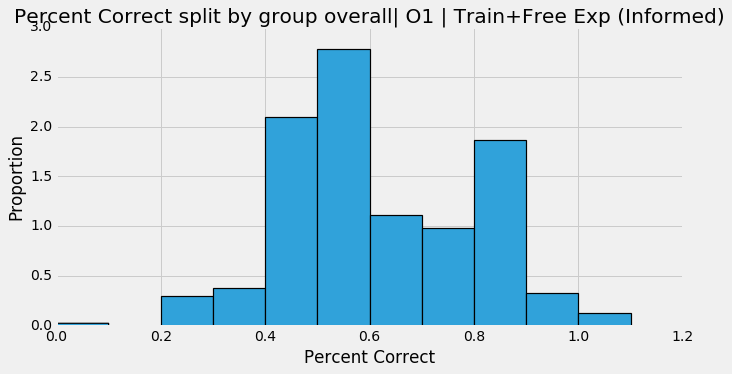

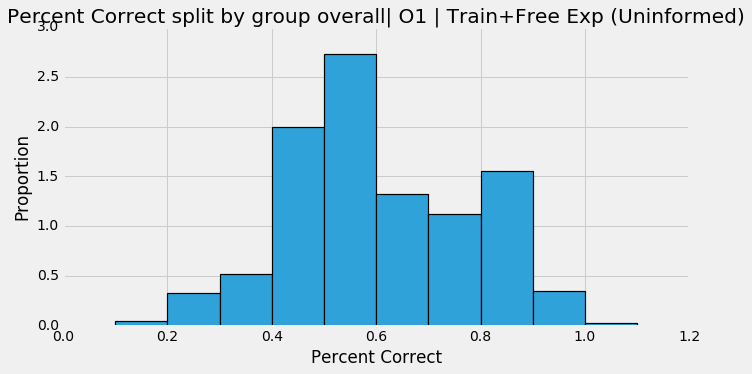

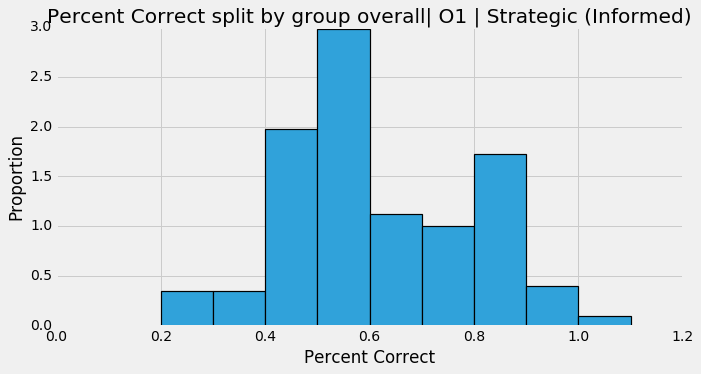

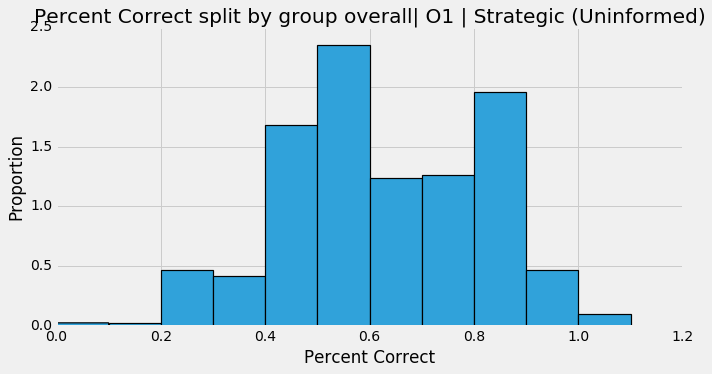

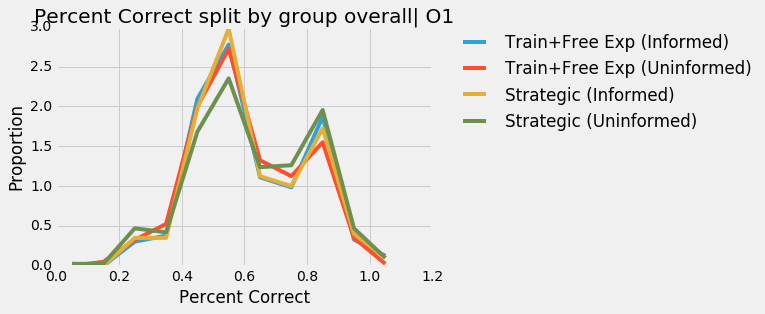

In [9]:

#Overall group data
def O1():
    index = 15
    data_group = [informedFT[:,index],uninformedFT[:,index],informedST[:,index],uninformedST[:,index]]

    #histogram data 
    bins = np.linspace(0,1.1,12)
    title = "Percent Correct split by group overall| O1"
    xlabel = "Percent Correct"
    ylabel = "Proportion"
   

    histogram(data_group[0],bins,title,group_labels[0],xlabel,ylabel)
    histogram(data_group[1],bins,title,group_labels[1],xlabel,ylabel)
    histogram(data_group[2],bins,title,group_labels[2],xlabel,ylabel)
    histogram(data_group[3],bins,title,group_labels[3],xlabel,ylabel)
    linehistogram(data_group,bins,title,group_labels,xlabel,ylabel)

O1()



### Percent Correct by task overall O2

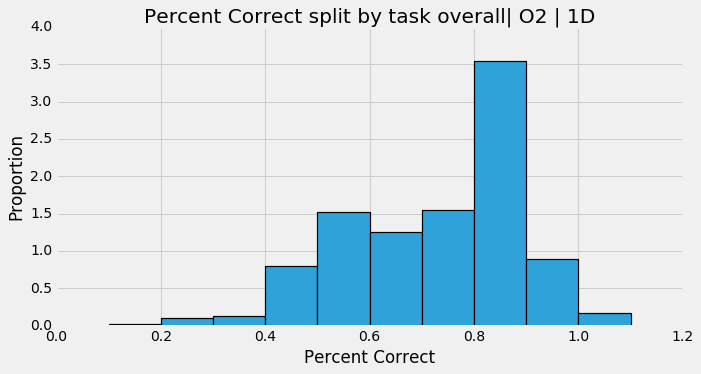

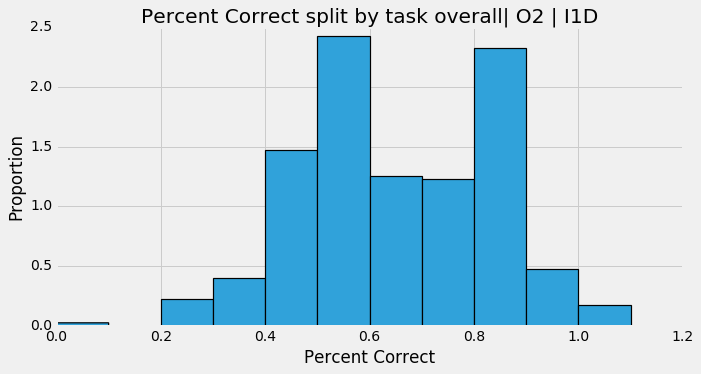

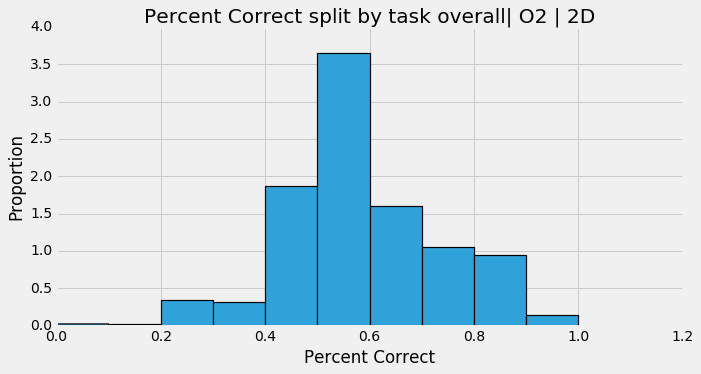

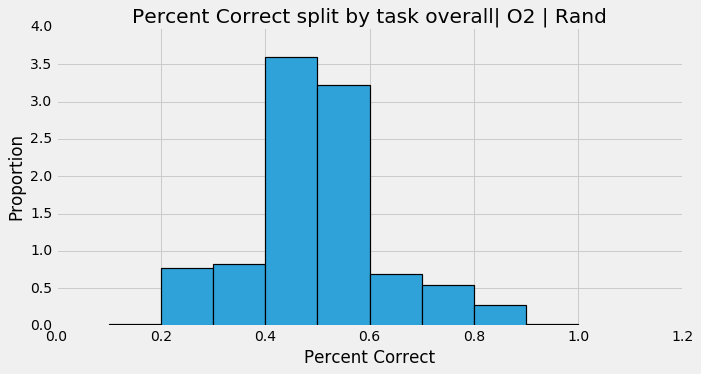

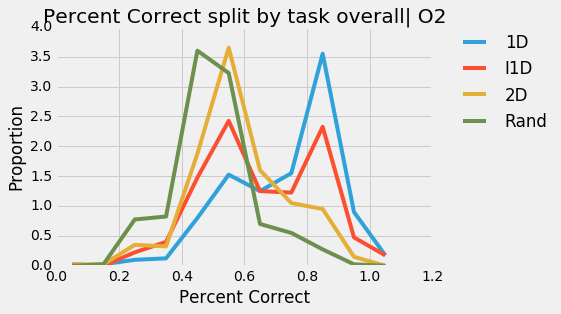

In [10]:


def O2():

    index = 15

    #Data Group
    data_group = [oneD[:,index],oneID[:,index],twoD[:,index],rand[:,index]]

    #histogram data 
    bins = np.linspace(0,1.1,12)
    xlabel = "Percent Correct"
    ylabel = "Proportion"
    title = "Percent Correct split by task overall| O2"


    #Overall group data
    histogram(data_group[0],bins,title,task_categories[0],xlabel,ylabel)
    histogram(data_group[1],bins,title,task_categories[1],xlabel,ylabel)
    histogram(data_group[2],bins,title,task_categories[2],xlabel,ylabel)
    histogram(data_group[3],bins,title,task_categories[3],xlabel,ylabel)
    linehistogram(data_group,bins,title,task_categories,xlabel,ylabel)

    
O2()

### Percent Correct split by group across tasks O3

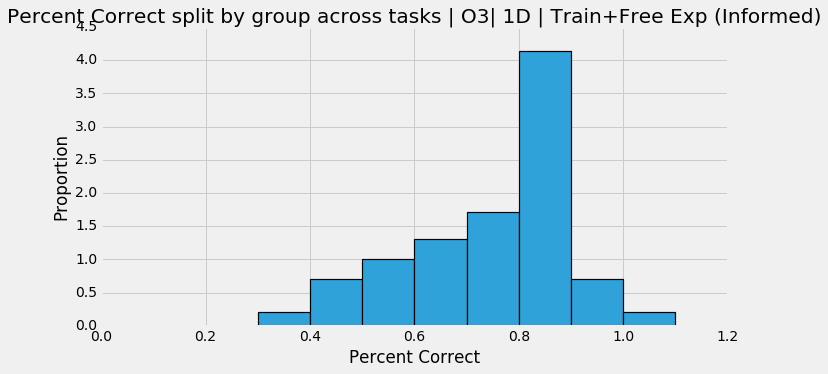

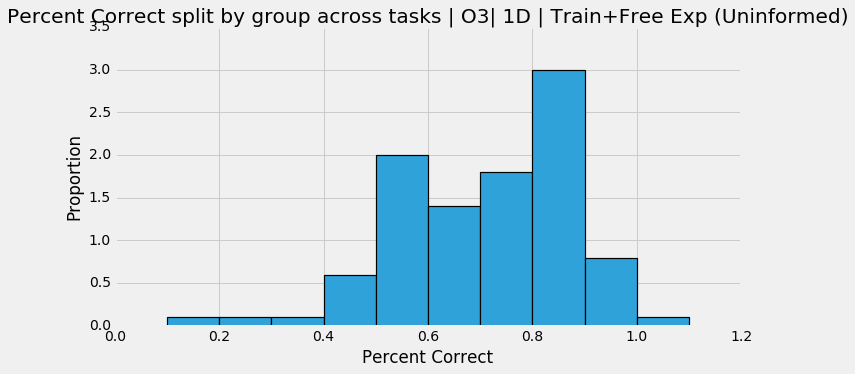

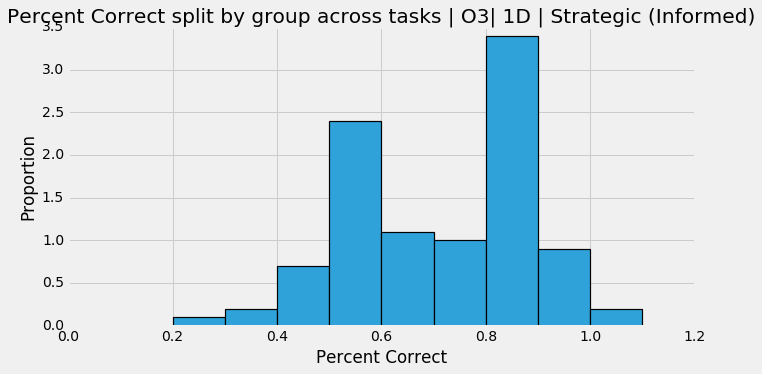

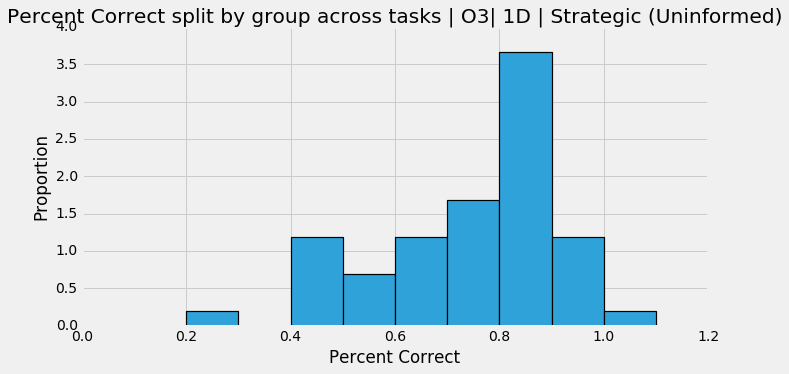

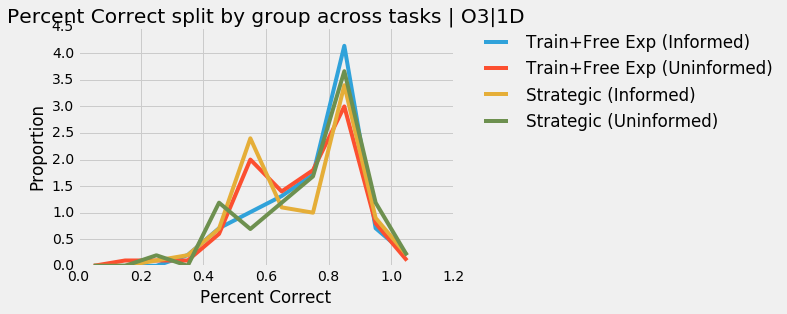

...

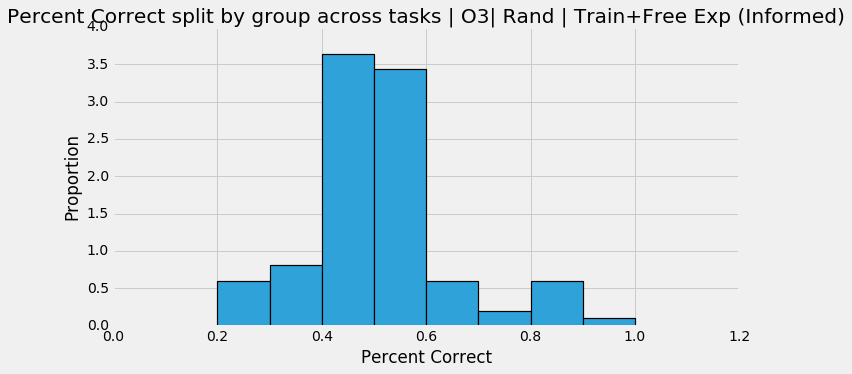

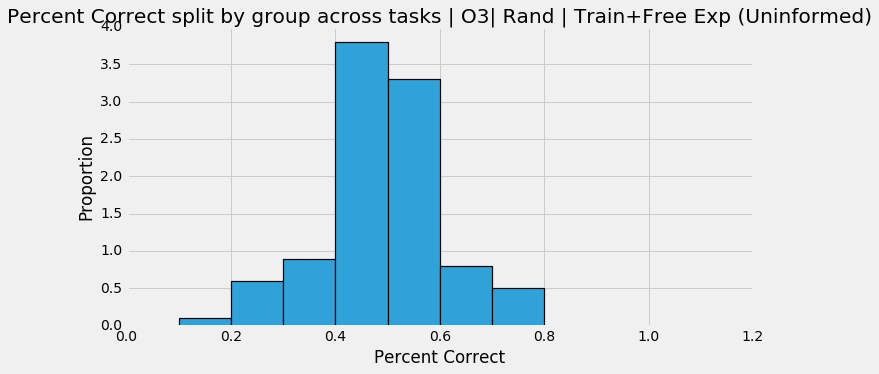

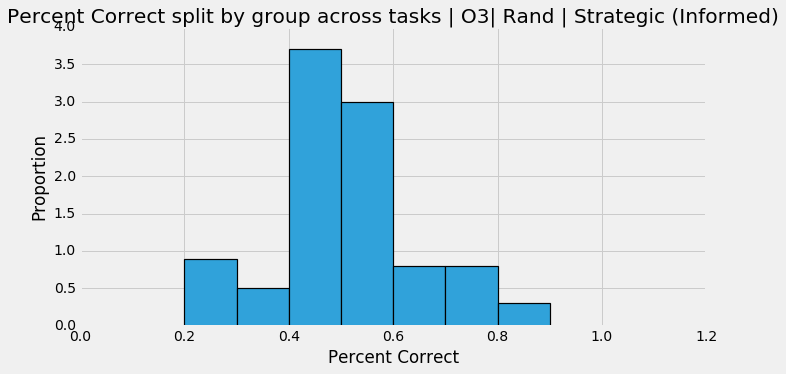

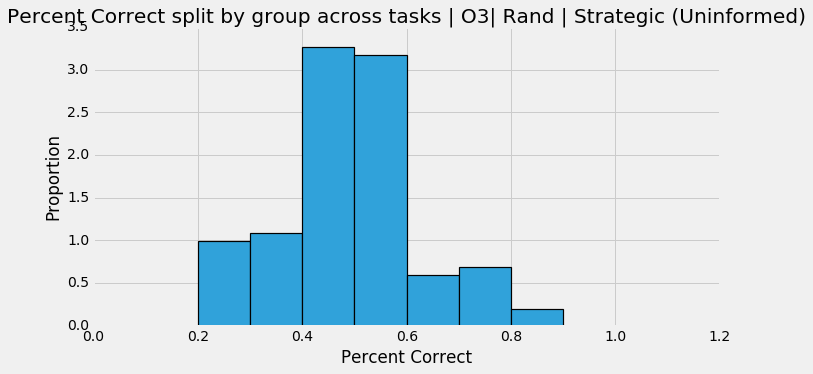

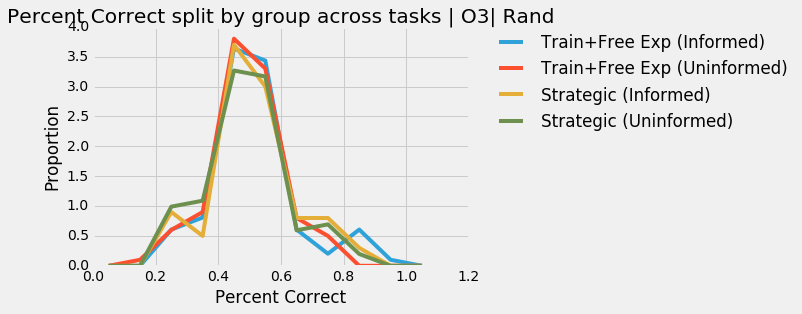

In [11]:


def O3():
    title = "Percent Correct split by group across tasks | O3"
    index = 15
    #histogram data 
    bins = np.linspace(0,1.1,12)
    xlabel = "Percent Correct"
    ylabel = "Proportion"



    #oneD
    data_group = [oneD[oneD[:,16] == 0],oneD[oneD[:,16] == 1],oneD[oneD[:,16] == 2],oneD[oneD[:,16] == 3]]
    
    
    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[0],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "|" + task_categories[0],group_labels,xlabel,ylabel)

    #oneID
    data_group = [oneID[oneID[:,16] == 0],oneID[oneID[:,16] == 1],oneID[oneID[:,16] == 2],oneID[oneID[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[0],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[1],group_labels,xlabel,ylabel)


    #twoD
    data_group = [twoD[twoD[:,16] == 0],twoD[twoD[:,16] == 1],twoD[twoD[:,16] == 2],twoD[twoD[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[2],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[2],group_labels,xlabel,ylabel)

    #Rand
    data_group = [rand[rand[:,16] == 0],rand[rand[:,16] == 1],rand[rand[:,16] == 2],rand[rand[:,16] == 3]]

    for i in range(4):
        
        histogram(data_group[i][:,index],bins,title + "| "+task_categories[3],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[3],group_labels,xlabel,ylabel)


O3()



### Percent Correct split by tasks across groups | O4 (Need to do analysis again!!!!)

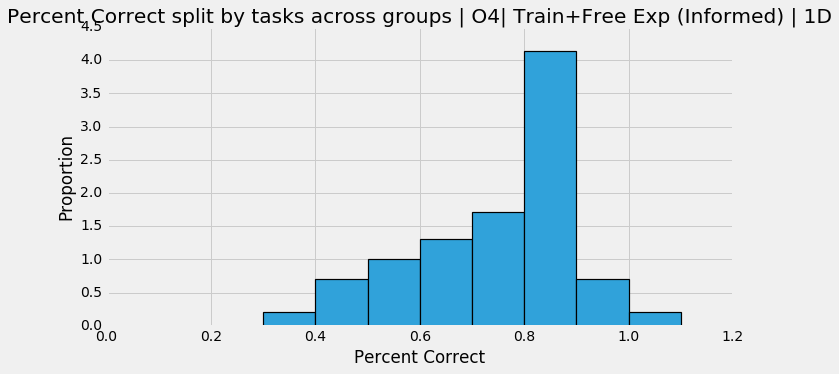

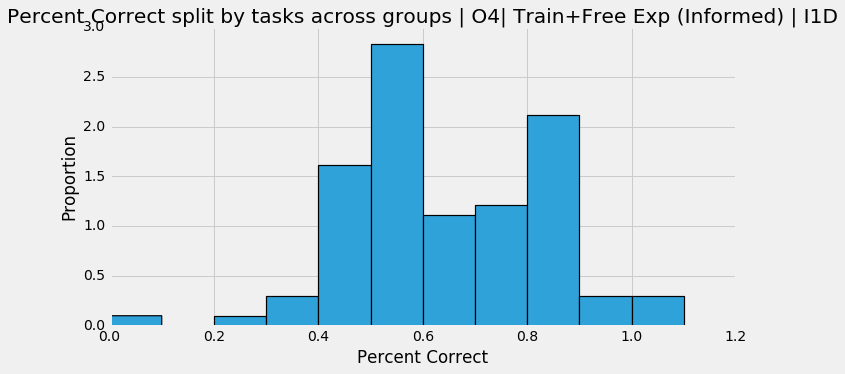

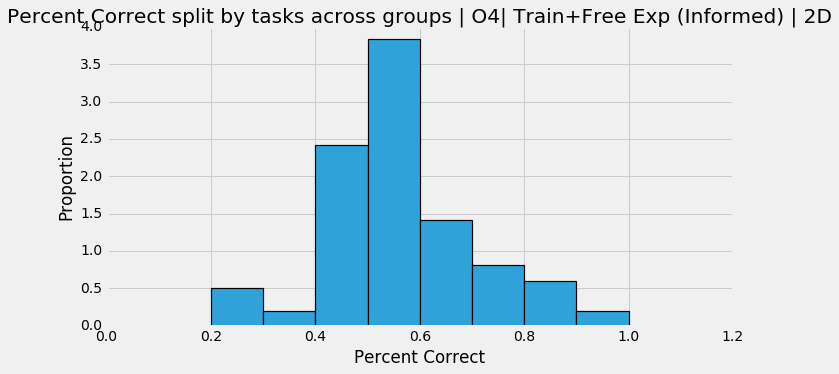

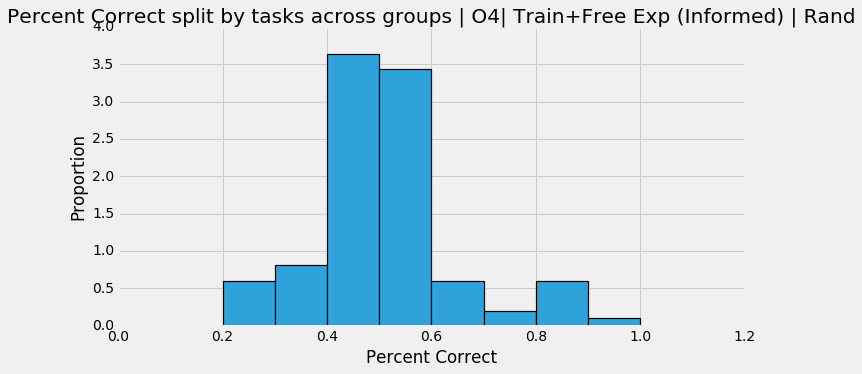

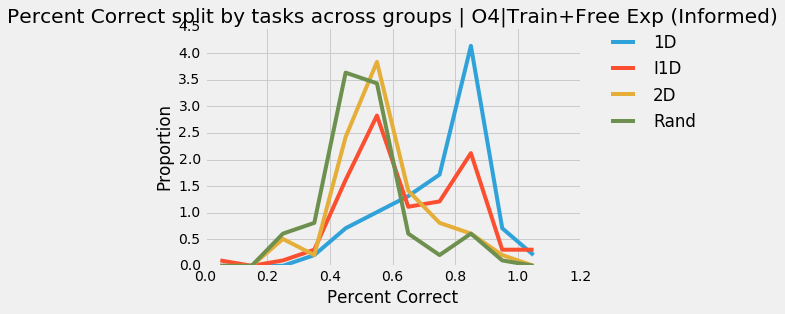

...

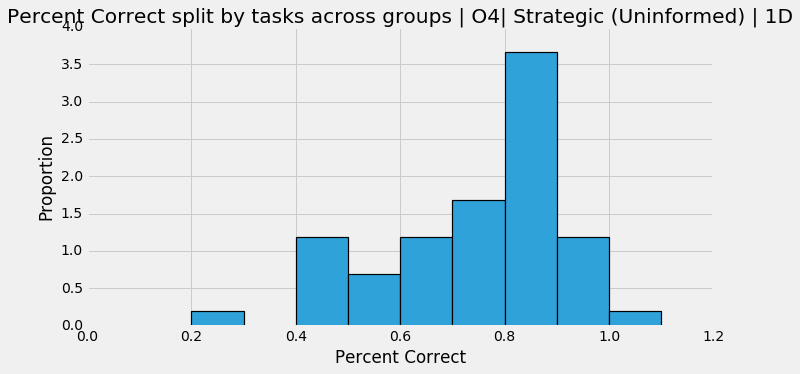

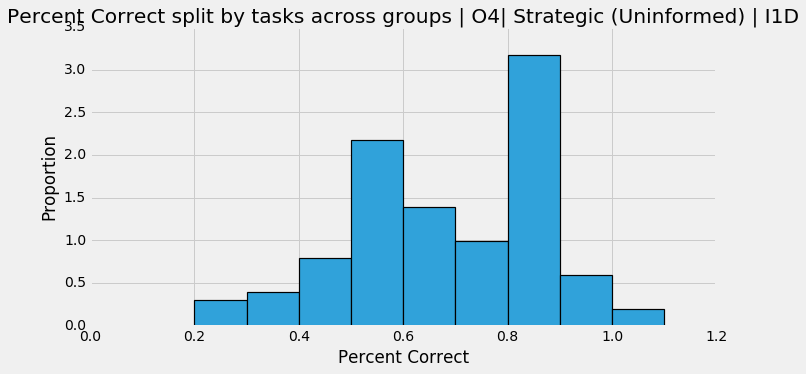

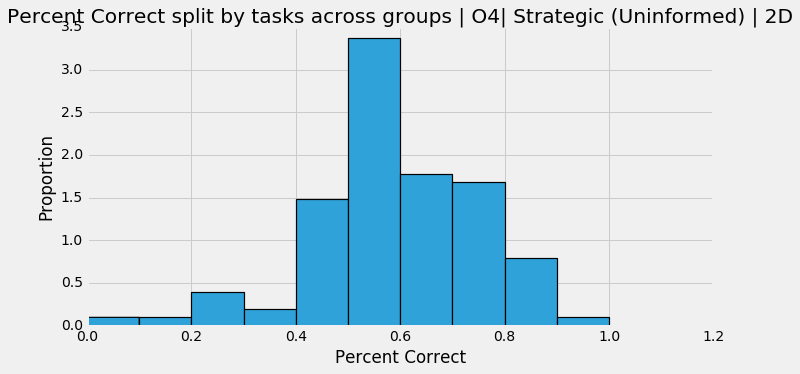

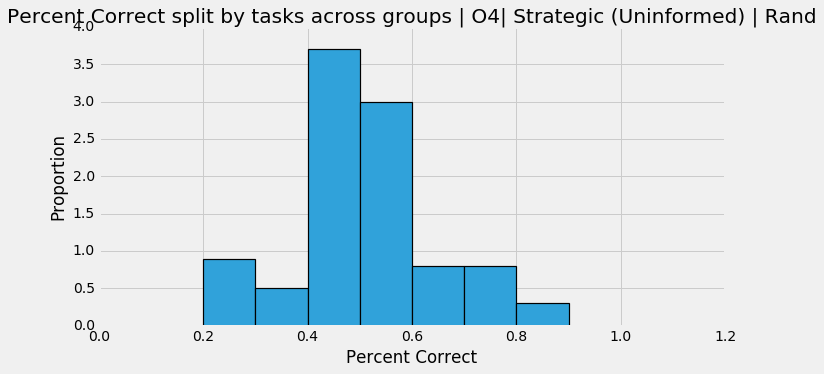

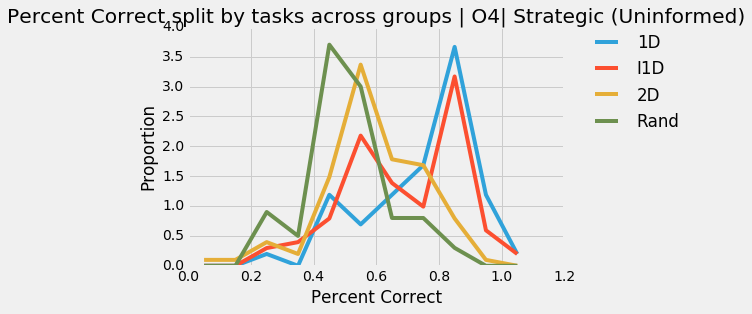

In [12]:


def O4():
    title = "Percent Correct split by tasks across groups | O4"
    index = 15
    #histogram data 
    bins = np.linspace(0,1.1,12)
    xlabel = "Percent Correct"
    ylabel = "Proportion"



    #informedFT
    data_group = [informedFT[informedFT[:,2] == 0],informedFT[informedFT[:,2] == 1],informedFT[informedFT[:,2] == 2],informedFT[informedFT[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[0],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "|" + group_labels[0],task_categories,xlabel,ylabel)

    #uninformedFT
    data_group = [uninformedFT[uninformedFT[:,2] == 0],uninformedFT[uninformedFT[:,2] == 1],uninformedFT[uninformedFT[:,2] == 2],uninformedFT[uninformedFT[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[1],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[1],task_categories,xlabel,ylabel)


    #informedS
    data_group = [informedST[informedST[:,2] == 0],informedST[informedST[:,2] == 1],informedST[informedST[:,2] == 2],informedST[informedST[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[2],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[2],task_categories,xlabel,ylabel)

    #UninformedS
    data_group = [uninformedST[uninformedST[:,2] == 0],uninformedST[uninformedST[:,2] == 1],uninformedST[uninformedST[:,2] == 2],informedST[informedST[:,2] == 3]]

    for i in range(4):
        
        histogram(data_group[i][:,index],bins,title + "| "+group_labels[3],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[3],task_categories,xlabel,ylabel)


O4()



### Learnability by group overall O5

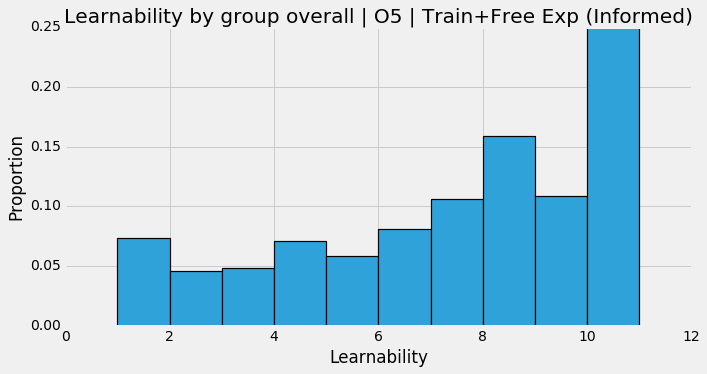

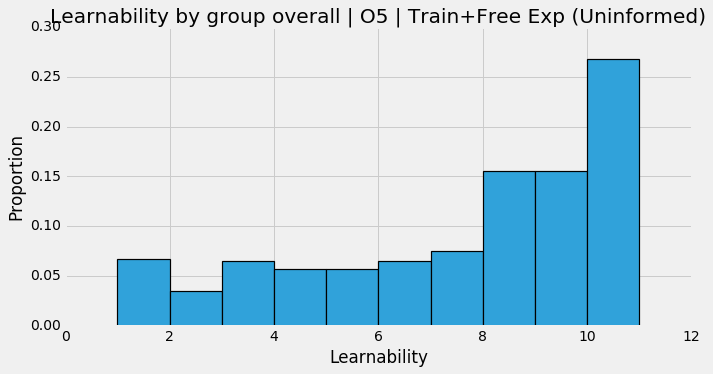

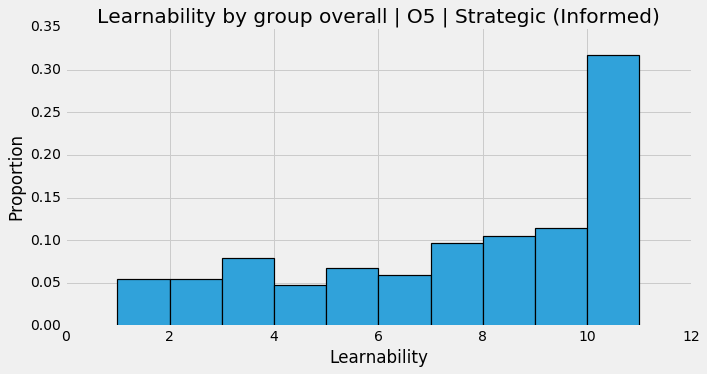

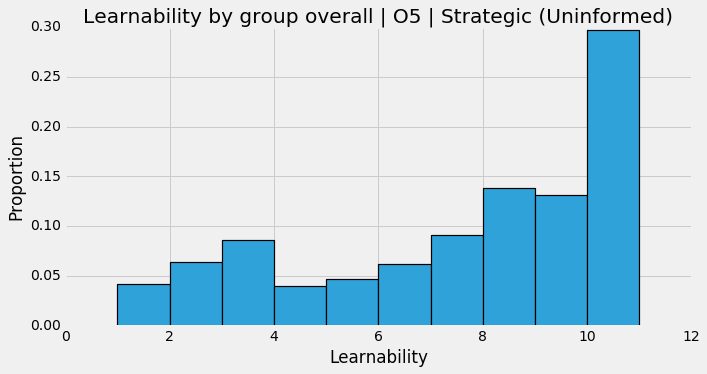

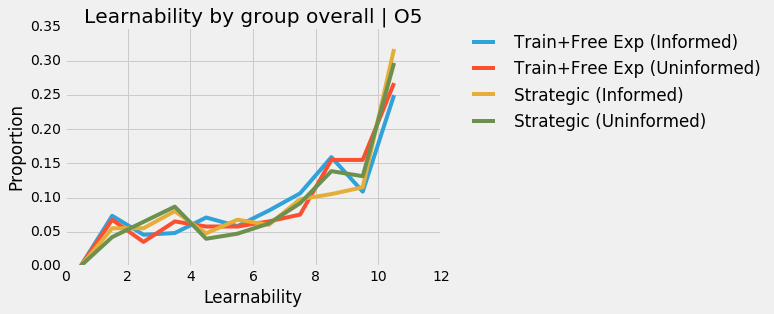

In [13]:
#Learnability
def O5():
    index = 12
    #Groups
    informedFT = freeT[freeT[:,1]==0]
    uninformedFT = freeT[freeT[:,1]==1]
    informedST = stra[stra[:,1]==0]
    uninformedST = stra[stra[:,1]==1]

    data_group = [informedFT[:,index],uninformedFT[:,index],informedST[:,index],uninformedST[:,index]]
    #histogram data 
    bins = np.arange(12)
    title = "Learnability by group overall | O5"
    xlabel = "Learnability"
    ylabel = "Proportion"

    histogram(data_group[0],bins,title,group_labels[0],xlabel,ylabel)
    histogram(data_group[1],bins,title,group_labels[1],xlabel,ylabel)
    histogram(data_group[2],bins,title,group_labels[2],xlabel,ylabel)
    histogram(data_group[3],bins,title,group_labels[3],xlabel,ylabel)
    linehistogram(data_group,bins,title,group_labels,xlabel,ylabel)

O5()

### Learnability by task overall O6

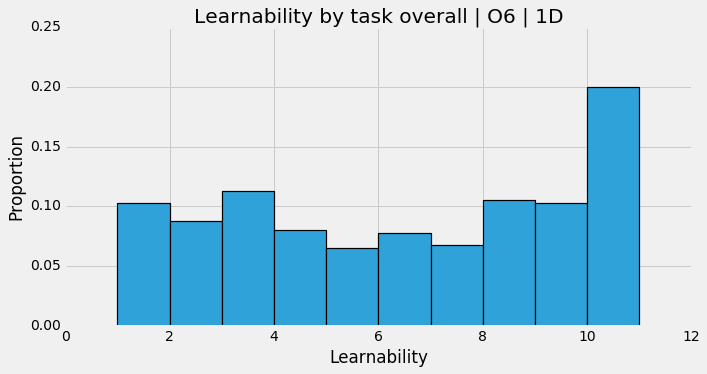

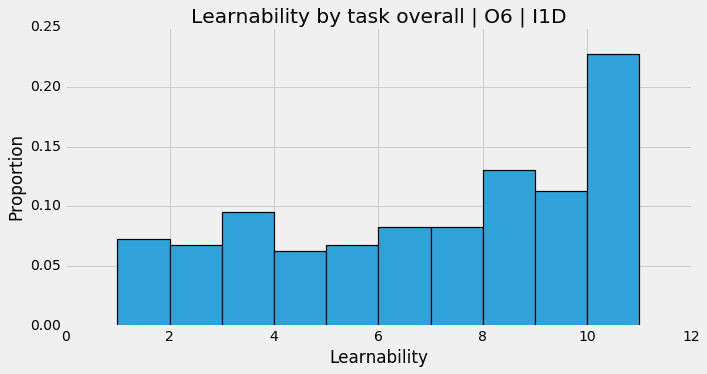

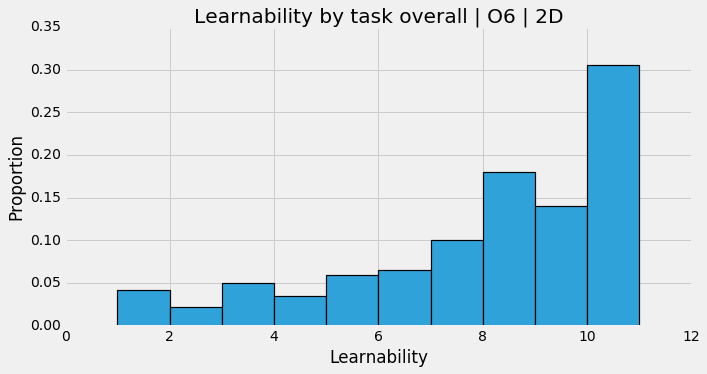

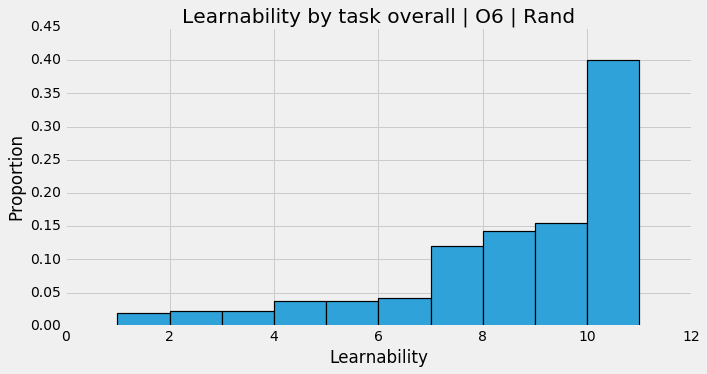

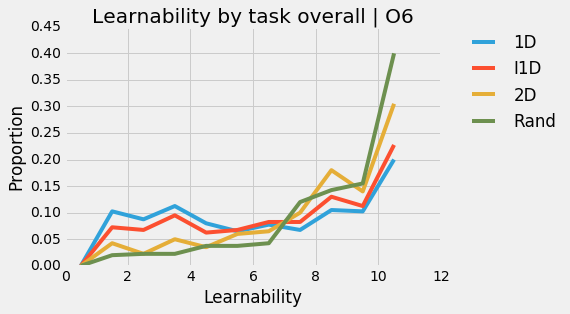

In [14]:
#Learnability
def O6():
    index = 12

    #Data Group
    data_group = [oneD[:,index],oneID[:,index],twoD[:,index],rand[:,index]]
    #histogram data 
    bins = np.arange(12)
    title = "Learnability by task overall | O6"
    xlabel = "Learnability"
    ylabel = "Proportion"

    histogram(data_group[0],bins,title,task_categories[0],xlabel,ylabel)
    histogram(data_group[1],bins,title,task_categories[1],xlabel,ylabel)
    histogram(data_group[2],bins,title,task_categories[2],xlabel,ylabel)
    histogram(data_group[3],bins,title,task_categories[3],xlabel,ylabel)
    linehistogram(data_group,bins,title,task_categories,xlabel,ylabel)

O6()

### Learnability split by group across tasks O7

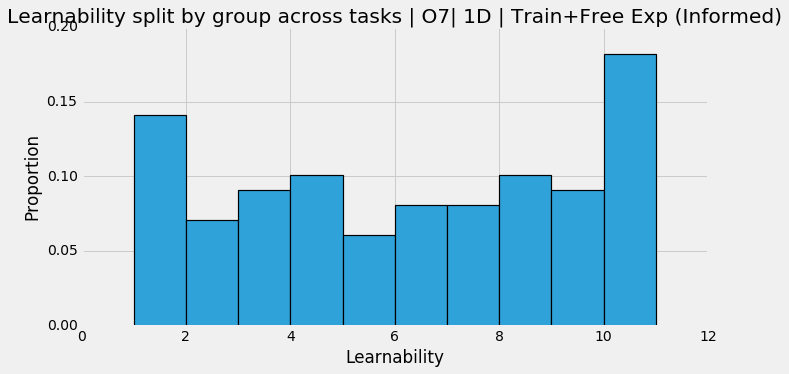

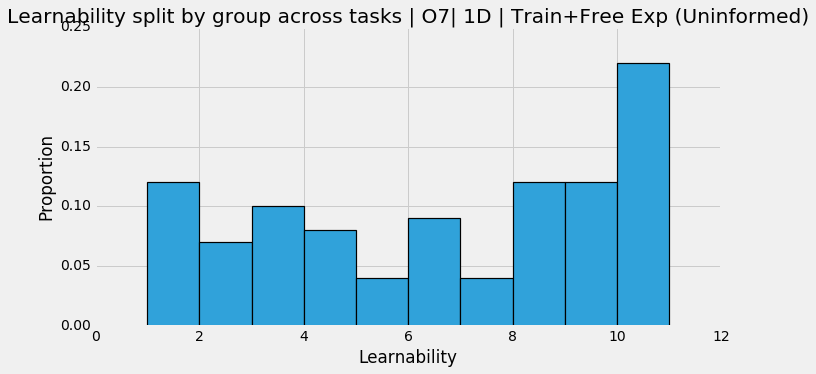

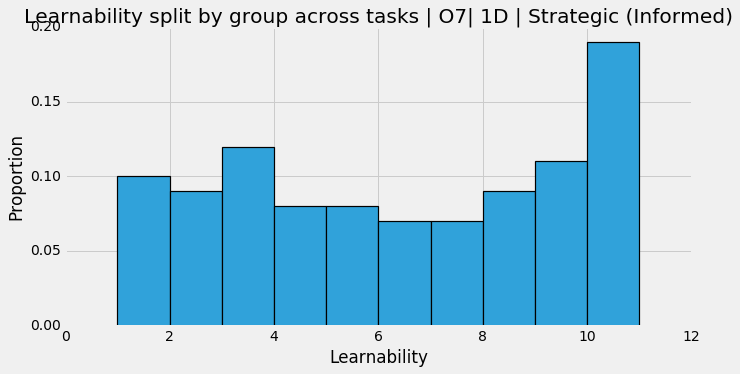

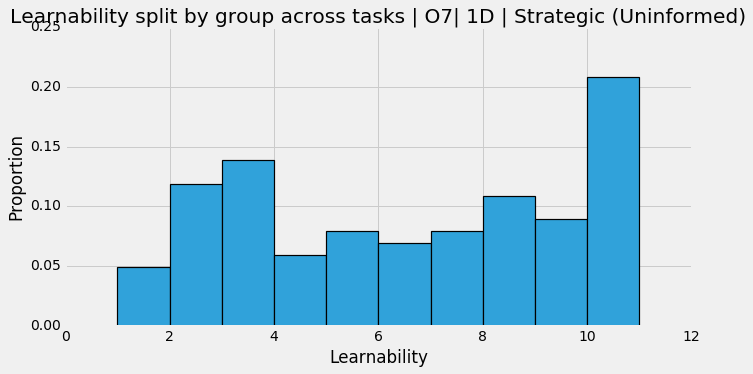

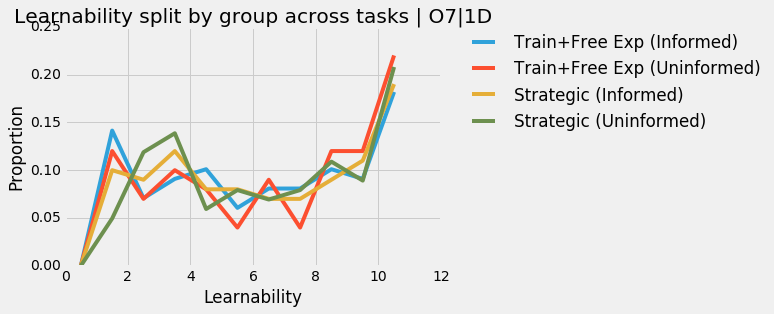

...

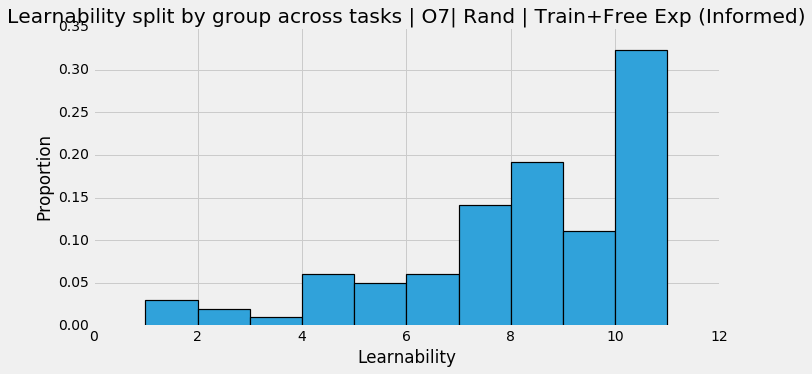

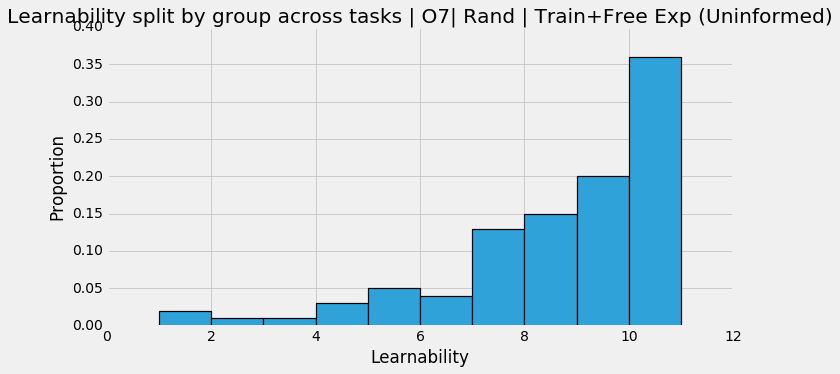

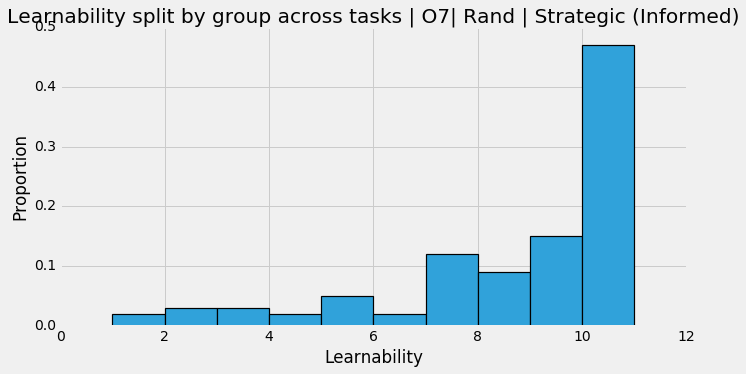

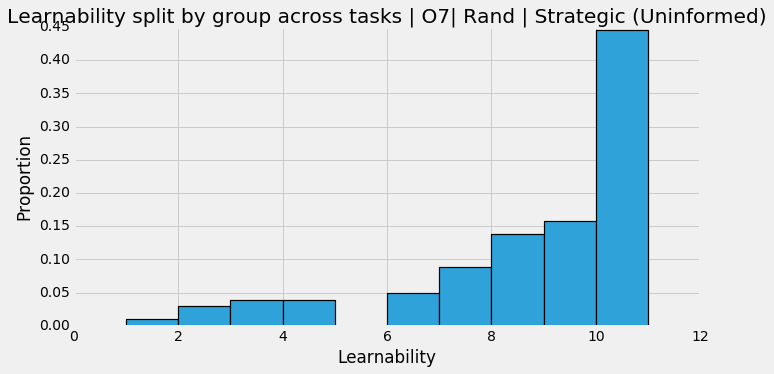

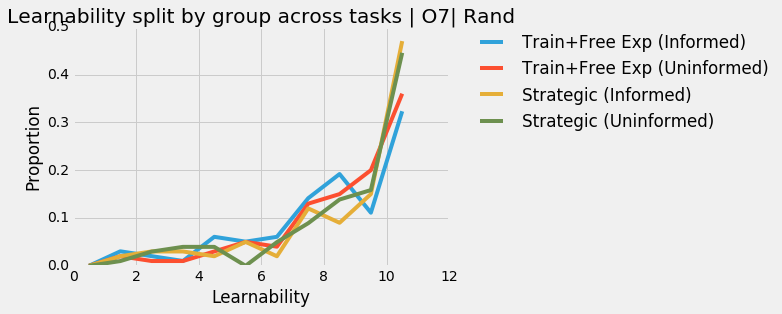

In [15]:
def O7():
    index = 12
    #split by group across tasks
    #histogram data 
    bins = np.arange(12)
    title = "Learnability split by group across tasks | O7"
    xlabel = "Learnability"
    ylabel = "Proportion"
    
    #oneD
    data_group = [oneD[oneD[:,16] == 0],oneD[oneD[:,16] == 1],oneD[oneD[:,16] == 2],oneD[oneD[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[0],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "|" + task_categories[0],group_labels,xlabel,ylabel)

    #oneID
    data_group = [oneID[oneID[:,16] == 0],oneID[oneID[:,16] == 1],oneID[oneID[:,16] == 2],oneID[oneID[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[1],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[1],group_labels,xlabel,ylabel)


    #twoD
    data_group = [twoD[twoD[:,16] == 0],twoD[twoD[:,16] == 1],twoD[twoD[:,16] == 2],twoD[twoD[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[2],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[2],group_labels,xlabel,ylabel)

    #Rand
    data_group = [rand[rand[:,16] == 0],rand[rand[:,16] == 1],rand[rand[:,16] == 2],rand[rand[:,16] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+task_categories[3],group_labels[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + task_categories[3],group_labels,xlabel,ylabel)

O7()


### Learnability split by task across groups O8

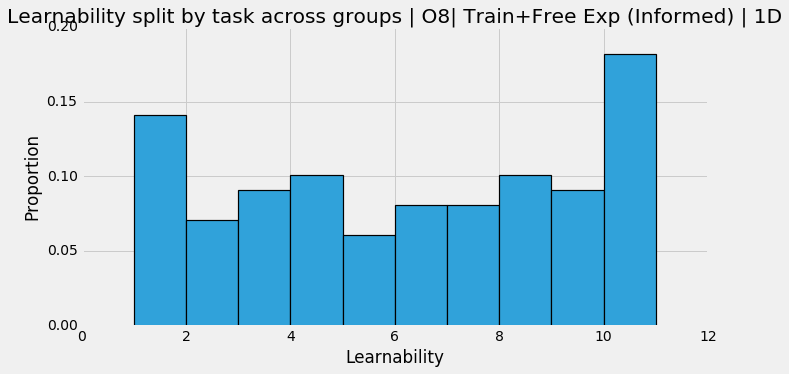

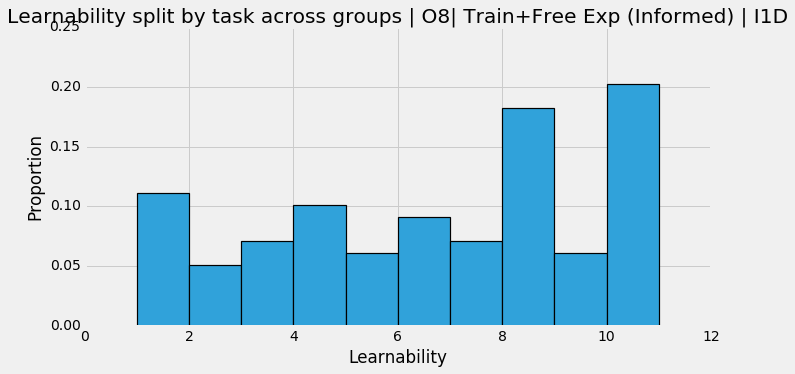

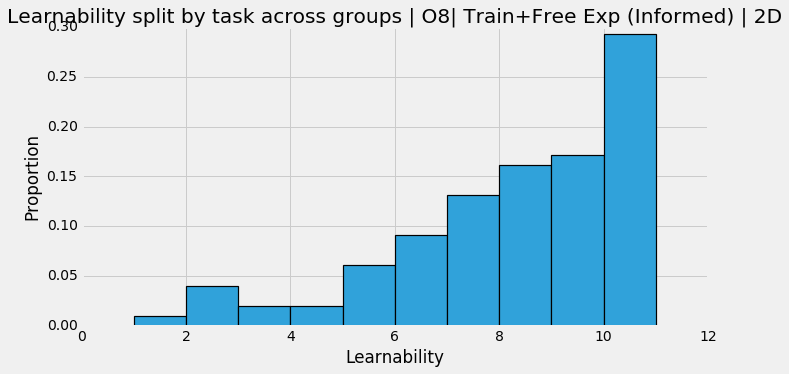

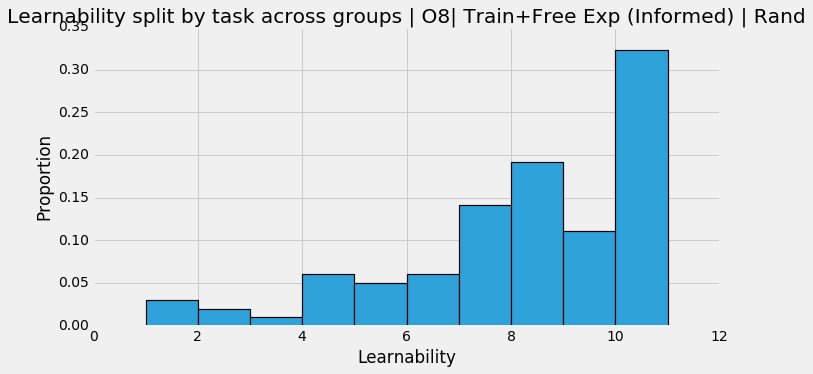

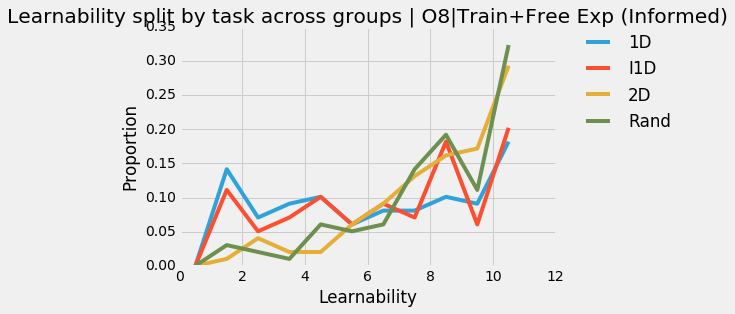

...

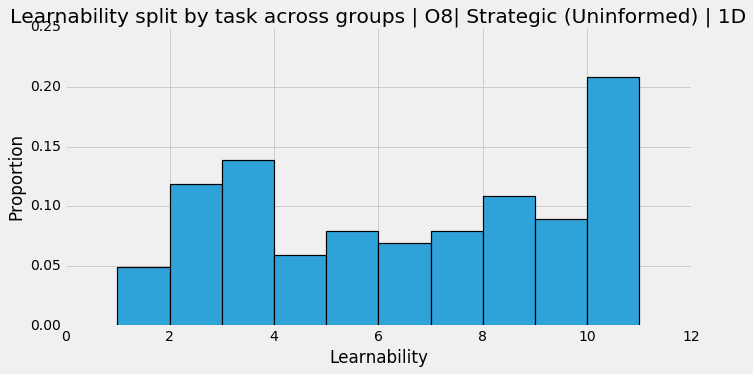

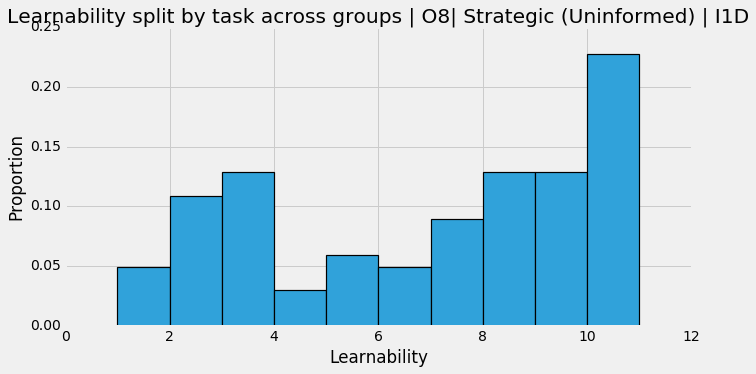

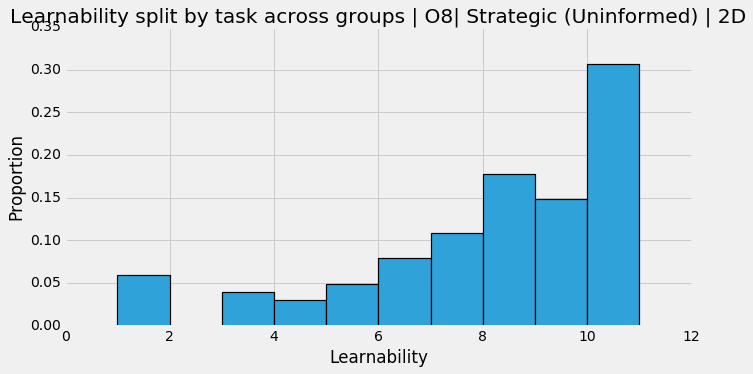

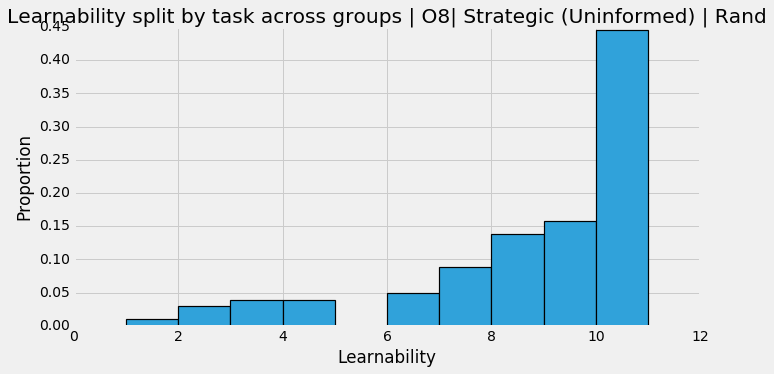

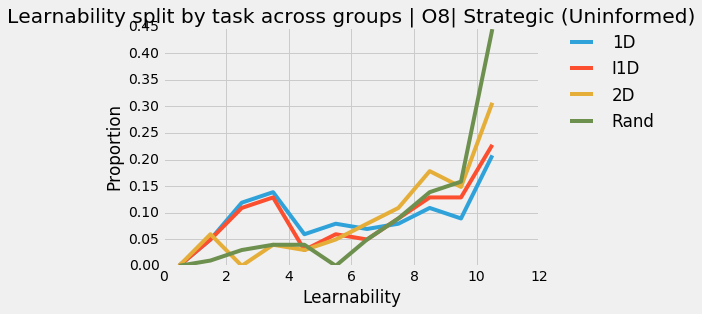

In [16]:
def O8():
    index = 12
    #split by group across tasks
    #histogram data 
    bins = np.arange(12)
    title = "Learnability split by task across groups | O8"
    xlabel = "Learnability"
    ylabel = "Proportion"
    
    #informedFT
    data_group = [informedFT[informedFT[:,2] == 0],informedFT[informedFT[:,2] == 1],informedFT[informedFT[:,2] == 2],informedFT[informedFT[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[0],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "|" + group_labels[0],task_categories,xlabel,ylabel)

    #uninformedFT
    data_group = [uninformedFT[uninformedFT[:,2] == 0],uninformedFT[uninformedFT[:,2] == 1],uninformedFT[uninformedFT[:,2] == 2],uninformedFT[uninformedFT[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[1],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[1],task_categories,xlabel,ylabel)


    #informedST
    data_group = [informedST[informedST[:,2] == 0],informedST[informedST[:,2] == 1],informedST[informedST[:,2] == 2],informedST[informedST[:,2] == 3]]

    for i in range(4):

        histogram(data_group[i][:,index],bins,title + "| "+group_labels[2],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[2],task_categories,xlabel,ylabel)

    #uninformedST
    data_group = [uninformedST[uninformedST[:,2] == 0],uninformedST[uninformedST[:,2] == 1],uninformedST[uninformedST[:,2] == 2],uninformedST[uninformedST[:,2] == 3]]

    for i in range(4):
        
        histogram(data_group[i][:,index],bins,title + "| "+group_labels[3],task_categories[i],xlabel,ylabel)

    linehistogram([data_group[0][:,index],data_group[1][:,index],data_group[2][:,index],data_group[3][:,index]],bins,title + "| " + group_labels[3],task_categories,xlabel,ylabel)

O8()

### Rank Order Analysis  Percent Correct |  FC9

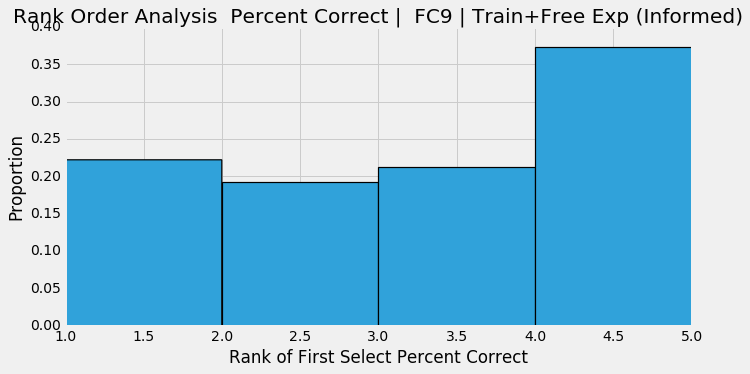

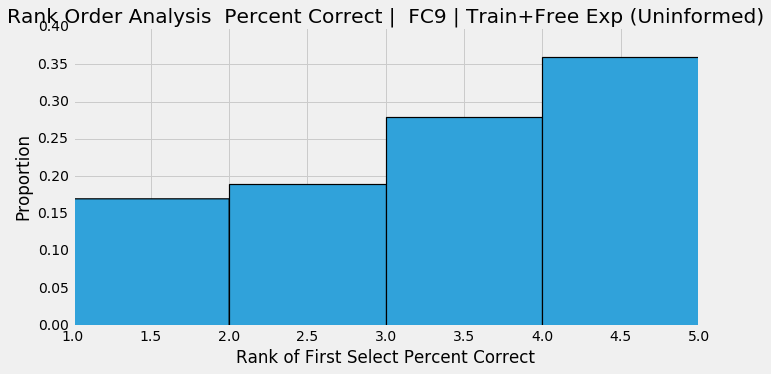

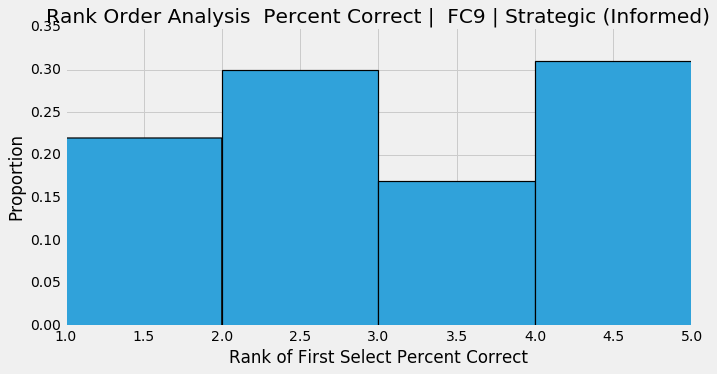

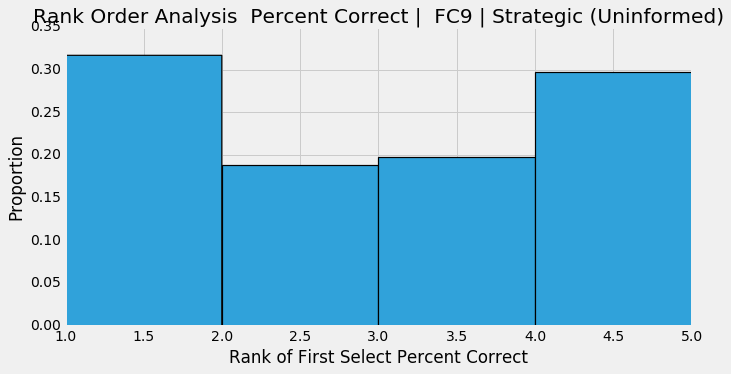

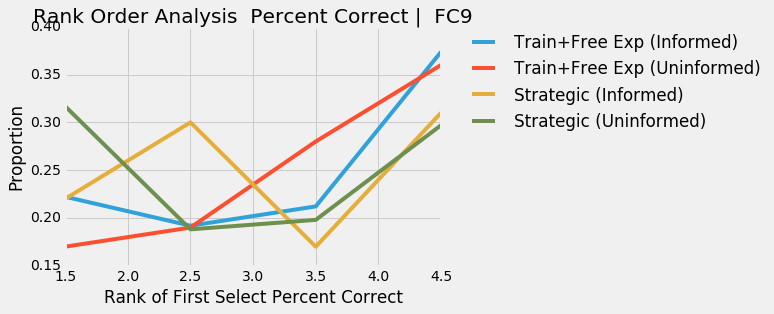

In [17]:
def getRankOrder(arr,index):
    rankOrder = []
    for i in range(int(len(arr)/4)):
        temp = arr[i*4:(i*4)+4,index].argsort()
        ranks = np.empty_like(temp)
        
        ranks[temp] = np.arange(len(ranks))
        ranks = ranks + 1
        rankOrder.append(ranks)
    return rankOrder



def getRankOfFirstOption(arr,index,splitCsvUser,userArr):
    # Get user-wise rank order for group 
    rankOrder = getRankOrder(arr,index)
    
    

    # get first option task category list of group
    firstOption = checkFirstOption(splitCsvUser,userArr)
    rankOfFirstOption = []
    # get rank order for the first selected task 
    for i in range(userArr):
        rankOfFirstOption.append(rankOrder[i][firstOption[i]])
    return rankOfFirstOption

def FC9():
    # % Correct index
    index =  15
    
    #Histogram Data 
    bins = np.arange(1,6)
    title = "Rank Order Analysis  Percent Correct |  FC9"
    xlabel = "Rank of First Select Percent Correct"
    ylabel = "Proportion"
    data_group = [getRankOfFirstOption(informedFT,index,splitCsvFTEI,usersFTEI),getRankOfFirstOption(uninformedFT,index,splitCsvFTEU,usersFTEU),getRankOfFirstOption(informedST,index,splitCsvSTEI,usersSTEI), getRankOfFirstOption(uninformedST,index,splitCsvSTEU,usersSTEU)]
    
    for i in range(4):

        histogram(data_group[i],bins,title,group_labels[i],xlabel,ylabel)

    linehistogram(data_group,bins,title,group_labels,xlabel,ylabel) 
   
    
FC9()


### Rank Order Analysis  Learnability |  FC10

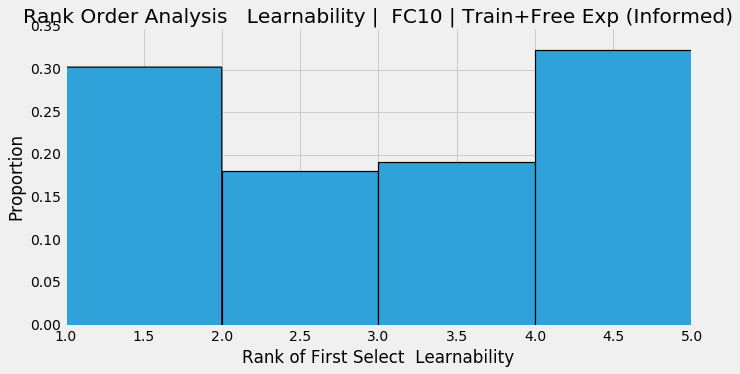

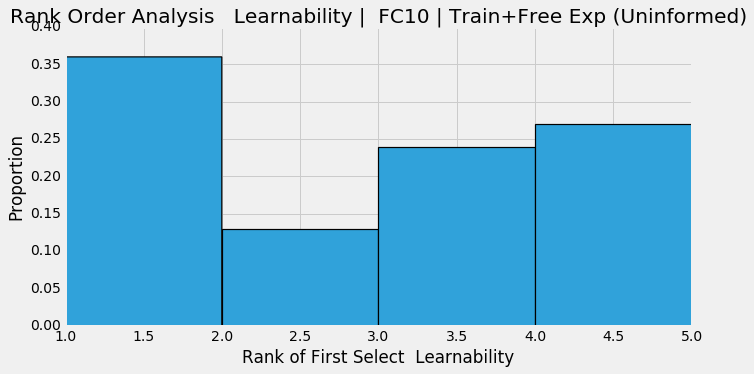

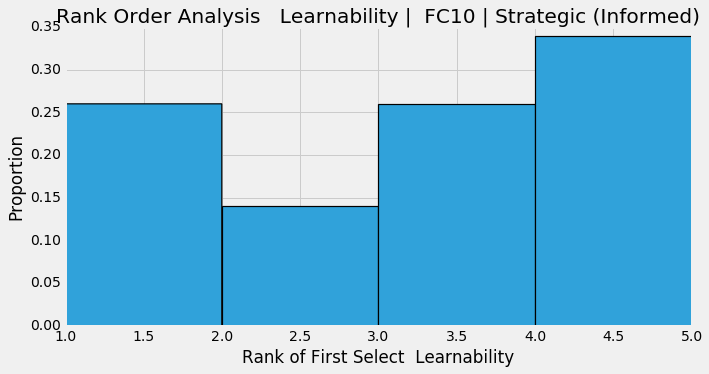

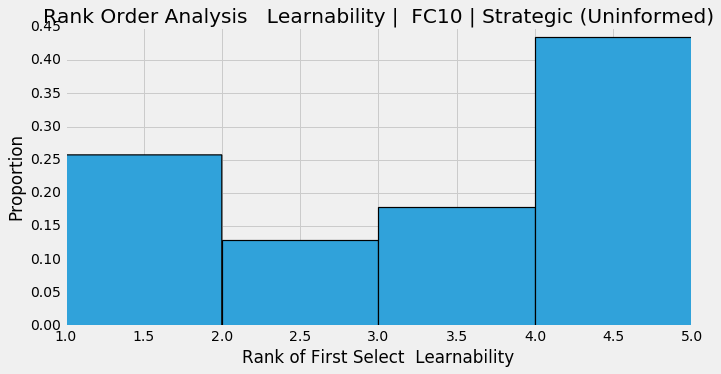

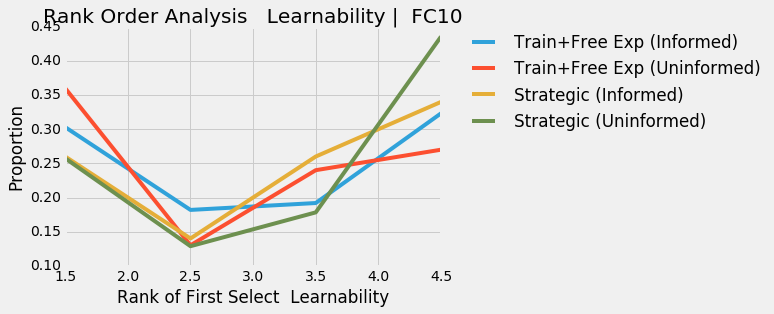

In [18]:
def FC10():
    # % Learnability index
    index =  12
    
    #Histogram Data 
    bins = np.arange(1,6)
    title = "Rank Order Analysis   Learnability |  FC10"
    xlabel = "Rank of First Select  Learnability"
    ylabel = "Proportion"
    data_group = [getRankOfFirstOption(informedFT,index,splitCsvFTEI,usersFTEI),getRankOfFirstOption(uninformedFT,index,splitCsvFTEU,usersFTEU),getRankOfFirstOption(informedST,index,splitCsvSTEI,usersSTEI), getRankOfFirstOption(uninformedST,index,splitCsvSTEU,usersSTEU)]
    
    for i in range(4):

        histogram(data_group[i],bins,title,group_labels[i],xlabel,ylabel)

    linehistogram(data_group,bins,title,group_labels,xlabel,ylabel) 
   
    
FC10()

###  Order of Presentation |  FC11 (Needs rewriting)

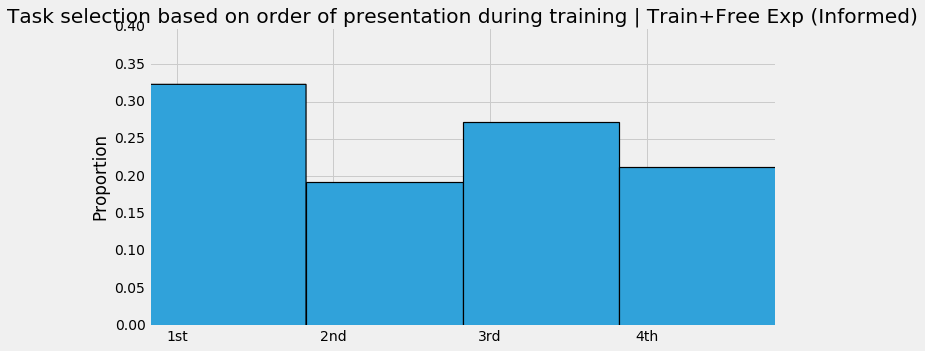

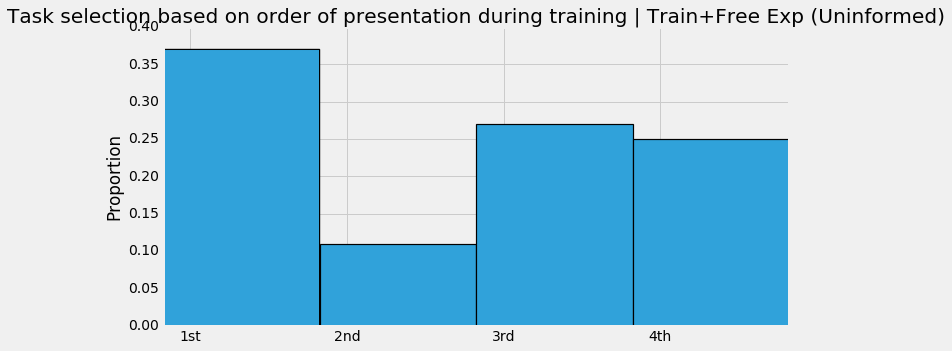

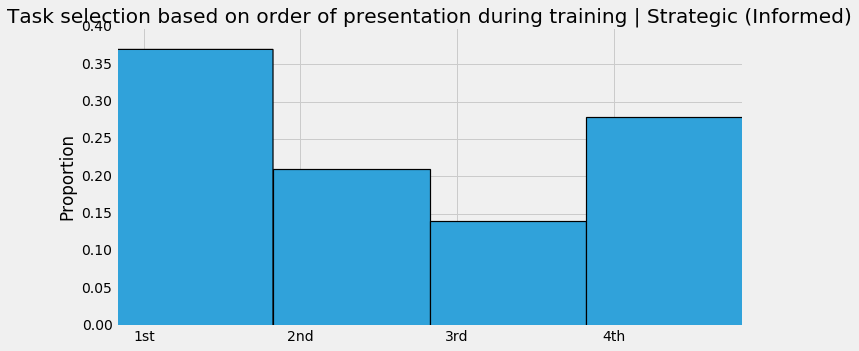

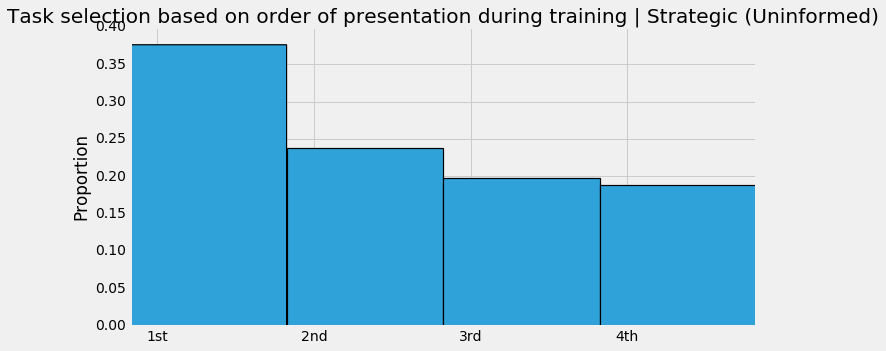

In [19]:
a3FTI = csvIntFT[csvIntFT[:,1] == 0,:]
a3FTU = csvIntFT[csvIntFT[:,1] == 1,:]
# Split by user
splita3FTI = [a3FTI[a3FTI[:,0]==i] for i in np.unique(a3FTI[:,0])]
splita3FTU = [a3FTU[a3FTU[:,0]==i] for i in np.unique(a3FTU[:,0])]

a3SI = csvIntST[csvIntST[:,1] == 0,:]
a3SU = csvIntST[csvIntST[:,1] == 1,:]
# Split by user
splita3SI = [a3SI[a3SI[:,0]==i] for i in np.unique(a3SI[:,0])]
splita3SU = [a3SU[a3SU[:,0]==i] for i in np.unique(a3SU[:,0])]

firstTrial=[]
def getFirstSelecOrder(arr, usersArr, strategic=False):
    if strategic:
        trVal = 2
    else:
        trVal = 1
    orderSelec = []
    for u in range(usersArr):
        tmp = arr[u]
        # Get only training part
        # for strategic learning this should be 2
        tmpPhase = tmp[tmp[:,2] == trVal,:]
        # Pass task column and get order indices then get order
        orderIndex = np.unique(tmpPhase[:,3], return_index=True)[1]
        orderTaskUser = [tmpPhase[ind, 3] for ind in sorted(orderIndex)]
        # Get only exploration part
        tmpPhase = tmp[tmp[:,2] == 0,:]
        firstSelec = tmpPhase[0,3]
        # Match that first selection to the order in which it showed up during training
        orderTrain = np.where(orderTaskUser == firstSelec)[0][0]
        orderSelec.append(orderTrain)
    return orderSelec
bins = np.arange(5)
def plotFirstSelecOrder(arr, usersArr, label, strategic=False):
    orderSelec = getFirstSelecOrder(arr, usersArr, strategic)
    firstTrial.append(orderSelec)
    
    ind = np.arange(tasks)  # the x locations for the groups
    width = 0.35       # the width of the bars
    
    fig, ax = plt.subplots(figsize=(10, 5))
    plt.hist(orderSelec, bins=np.arange(5), normed=True, edgecolor='black', linewidth=1.2)
    ax.set_title(''.join(['Task selection based on order of presentation during training | ', label]))
    ax.set_ylabel('Proportion')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(('1st', '2nd', '3rd', '4th'))
    ax.set_ylim([0,0.4])

plotFirstSelecOrder(splita3FTI, usersFTEI, 'Train+Free Exp (Informed)')
plotFirstSelecOrder(splita3FTU, usersFTEU, 'Train+Free Exp (Uninformed)')
plotFirstSelecOrder(splita3SI, usersSTEI, 'Strategic (Informed)',strategic=True)
plotFirstSelecOrder(splita3SU, usersSTEU, 'Strategic (Uninformed)',strategic=True)


### Does the relation between learnability and performance differ across groups of participants? 

* For each participant, fit a linear regression of learnability as a function of %correct. The %correct is across the 4 tasks.  

* Each person will give you ONE slope and ONE intercept.  

* Plot distributions of SLOPES: %of people (y axis) against slope(x axis) 

* Plot the 4 groups superimposed in each panel 

* Plot 5 panels: one panel for each task, and the 5th one across all the 4 tasks 

* For each panel, do a statistical test to decide if and how the groups differ from each other. This can be pairwise chi-sq or ranksum as you did before. Or (better) it could be a 1-way ANOVA (or Kruskal-Wallis for a non parametric ANOVA) with pairwise comparisons 

NameError: name 'master_slope' is not defined

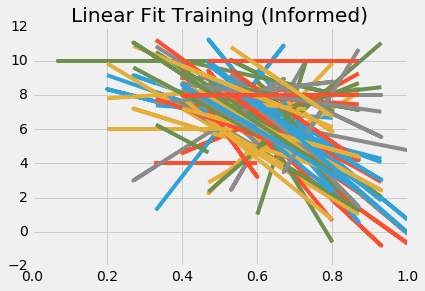

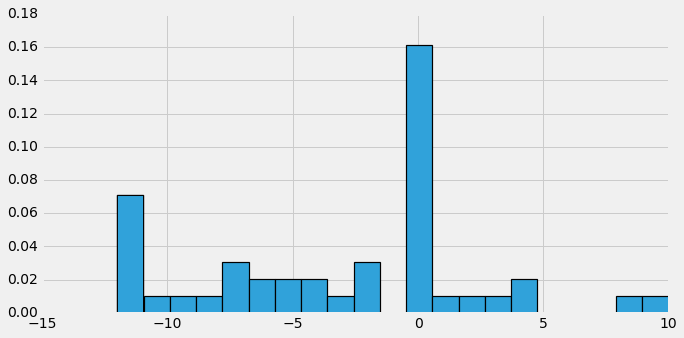

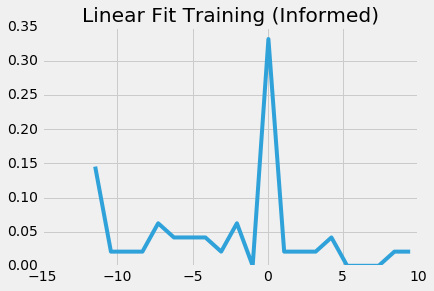

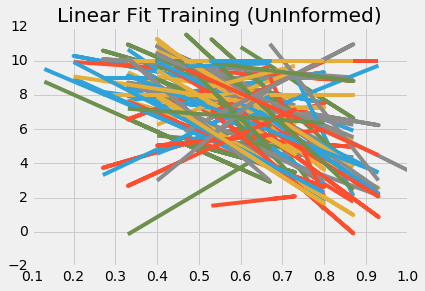

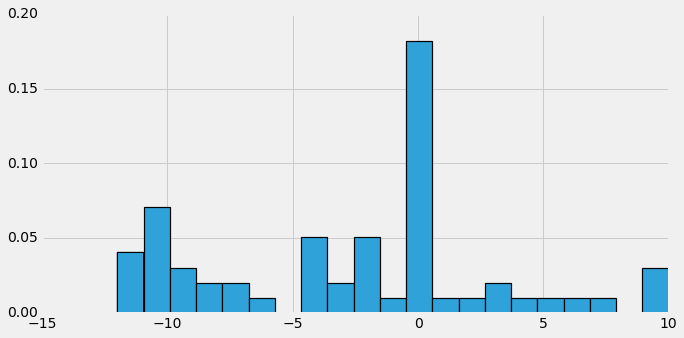

...

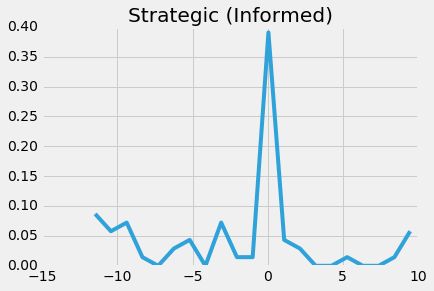

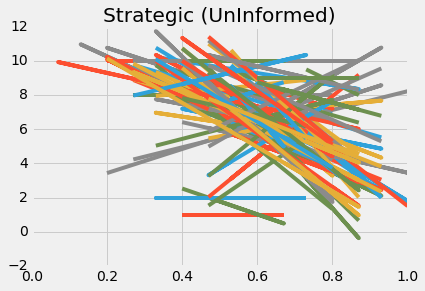

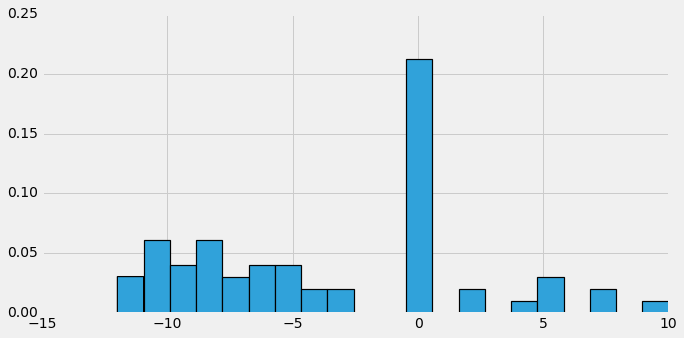

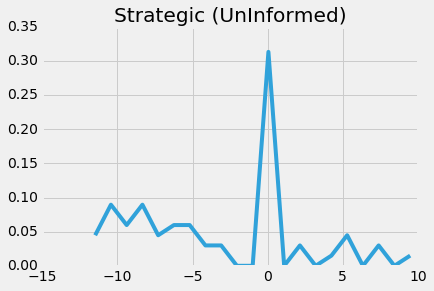

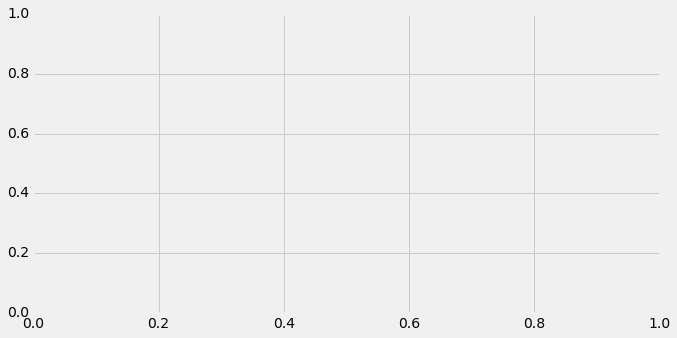

In [20]:


def indi_slope(arr,label):
    
    xi = arr[:,15]
    y  = arr[:,12]
    slope_list=[]
    plt.figure()
    
    for i in range(int(len(informedFT)/4)):
        slope, intercept, r_value, p_value, std_err = stats.linregress(xi[i*4:(i*4)+4],y[i*4:(i*4)+4])
        slope_list.append(slope)
        line = slope*xi[i*4:(i*4)+4]+intercept
        line1 = plt.plot(xi[i*4:(i*4)+4],line,label=label)
        pylab.title(label)
        ax = plt.gca()

    plt.figure()
    bins = np.linspace(-12,10,22)
    fig, ax = plt.subplots(figsize=(10, 5))
    # Normalize to sum 1
    weights = np.ones_like(slope_list)/len(slope_list)
    plt.hist(np.nan_to_num(slope_list), bins=bins, weights=weights, edgecolor='black', linewidth=1.2)
    ax = plt.figure()
    y,binEdges = np.histogram(np.nan_to_num(slope_list),bins=bins ,normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters,y,'-')
    plt.title(label)
    
 
 
   

indi_slope(informedFT,"Linear Fit Training (Informed)")
indi_slope(uninformedFT,"Linear Fit Training (UnInformed)")
indi_slope(informedST,"Strategic (Informed)")
indi_slope(uninformedST,"Strategic (UnInformed)")

#Final Graph for slope
plt.figure()
bins = np.linspace(-12,10,22)
fig, ax = plt.subplots(figsize=(10, 5))
# Normalize to sum 1
for i in range(4):
    weights = np.ones_like(master_slope[i])/len(master_slope[i])
    y,binEdges = np.histogram(np.nan_to_num(master_slope[i]),bins=bins ,normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters,y,'-',label = group_enum[i])
    pylab.title('Individual Slope of Learnability')
    plt.xlabel('Slope')
    plt.ylabel('Percentage of people')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
 


plt.figure()
bins = np.linspace(-25,25,25)
fig, ax = plt.subplots(figsize=(10, 5))

# Normalize to sum 1
for i in range(4):
    weights = np.ones_like(master_intercept[i])/len(master_intercept[i])
    y,binEdges = np.histogram(np.nan_to_num(master_intercept[i]),bins=bins ,normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters,y,'-',label = group_enum[i])
    pylab.title('Individual Intercept of Learnability')
    plt.xlabel('Intercept')
    plt.ylabel('Percentage of people')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)



### Open Loop 5 First Choice Analysis
* Percent Correct split by group across tasks FC1
* Learnability split by group across tasks FC2
* Percent Correct split by task across groups FC3
* Learnability by task FC4
* Rank Order Analysis 
    * 1. Percent Correct FC5
    * 2. Learnability FC6

### Slope Analysis

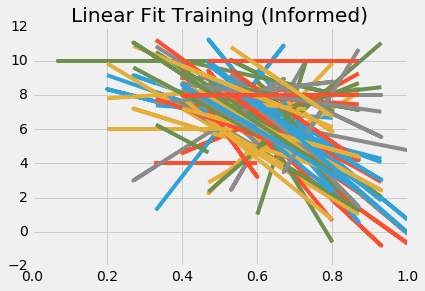

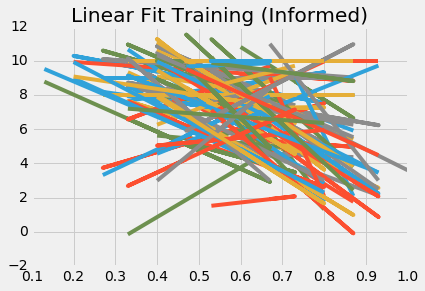

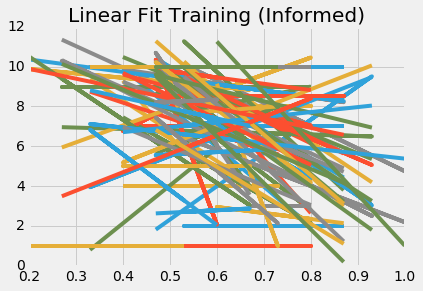

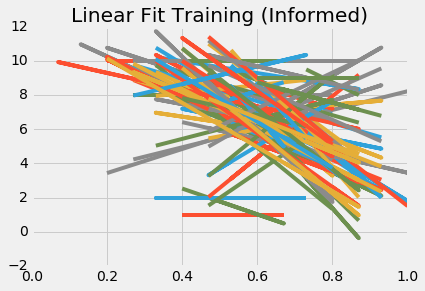

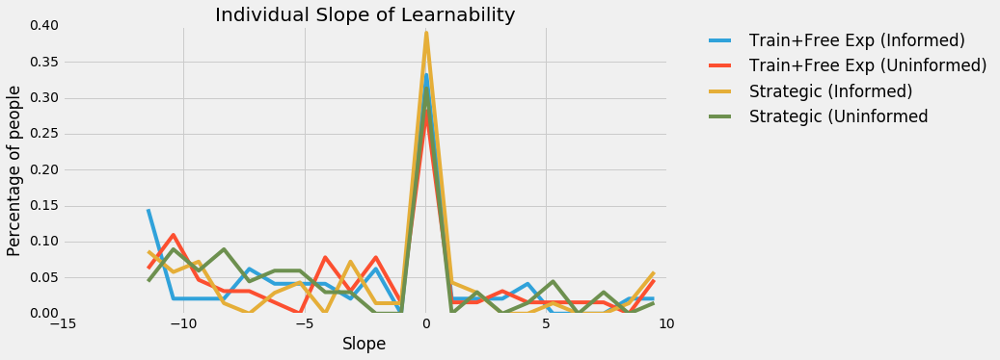

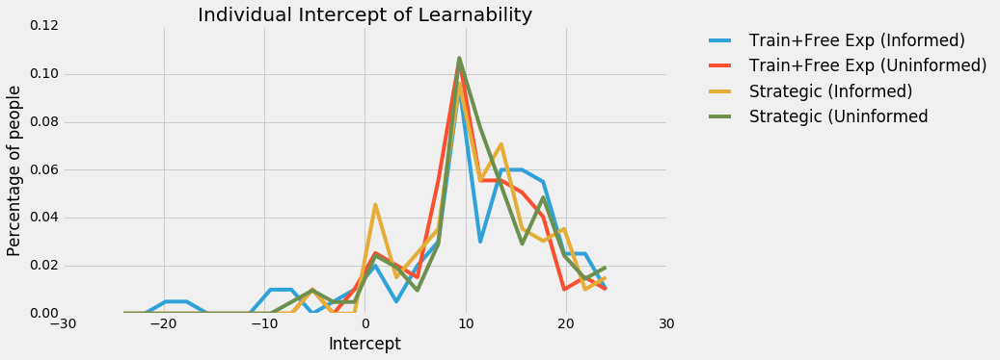

In [24]:

ift = freeTTr[freeTTr[:,1]==0]
uft = freeTTr[freeTTr[:,1]==1,:]
istr = straTr[straTr[:,1]==0,:]
ustr = straTr[straTr[:,1]==1,:]

firstTrial=[]

#Combine informed and uninformed to later form record_category
selFT = checkFirstOption(np.concatenate((splitCsvFTEI,splitCsvFTEU),axis=0),usersFTEI+usersFTEU)
selST = checkFirstOption(np.concatenate((splitCsvSTEI,splitCsvSTEU),axis=0), usersSTEI+usersSTEU)

#Create records separated by category (1D,1ID,2D,R) instead of informed/uninformed of Training,Strategic
record_category=[]

#Add additional element at the end of all groups to indicate their group when getting merged into single record
recordByCategory(np.vstack([np.concatenate((ift,np.full((np.shape(ift)[0],1),0)),axis=1),np.concatenate((uft,np.full((np.shape(uft)[0],1),1)),axis=1)]),selFT)
recordByCategory(np.vstack([np.concatenate((istr,np.full((np.shape(istr)[0],1),2)),axis=1),np.concatenate((ustr,np.full((np.shape(ustr)[0],1),3)),axis=1)]),selST)
record_category=np.asarray(record_category)



group_enum = {0:'Train+Free Exp (Informed)', 1:'Train+Free Exp (Uninformed)', 2:'Strategic (Informed)', 3:'Strategic (Uninformed'}
oneD = record_category[record_category[:,2]==0,:]
oneID = np.array(record_category[record_category[:,2]==1,:])
twoD = np.array(record_category[record_category[:,2]==2,:])
rand = np.array(record_category[record_category[:,2]==3,:])


master_slope=[]
master_intercept=[]
def indi_slope(arr):
    xi = arr[:,6]
    y  = arr[:,12]


    slope_list=[]
    intercept_list=[]
    plt.figure()
    for i in range(int(len(ift)/4)):
        slope, intercept, r_value, p_value, std_err = stats.linregress(xi[i*4:(i*4)+4],y[i*4:(i*4)+4])
        slope_list.append(slope)
        intercept_list.append(intercept)
        line = slope*xi[i*4:(i*4)+4]+intercept
        line1 = plt.plot(xi[i*4:(i*4)+4],line,label="1D")
        pylab.title('Linear Fit Training (Informed)')
        ax = plt.gca()
    
    master_slope.append(slope_list)
    master_intercept.append(intercept_list)
    


indi_slope(ift)
indi_slope(uft)
indi_slope(istr)
indi_slope(ustr)

#Final Graph for slope
plt.figure()
bins = np.linspace(-12,10,22)
fig, ax = plt.subplots(figsize=(10, 5))
# Normalize to sum 1
for i in range(4):
    weights = np.ones_like(master_slope[i])/len(master_slope[i])
    y,binEdges = np.histogram(np.nan_to_num(master_slope[i]),bins=bins ,normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters,y,'-',label = group_enum[i])
    pylab.title('Individual Slope of Learnability')
    plt.xlabel('Slope')
    plt.ylabel('Percentage of people')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)



plt.figure()
bins = np.linspace(-25,25,25)
fig, ax = plt.subplots(figsize=(10, 5))

# Normalize to sum 1
for i in range(4):
    weights = np.ones_like(master_intercept[i])/len(master_intercept[i])
    #plt.hist(np.nan_to_num(master_slope[i]), bins=bins, weights=weights, edgecolor='black', linewidth=1.2)
    y,binEdges = np.histogram(np.nan_to_num(master_intercept[i]),bins=bins ,normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters,y,'-',label = group_enum[i])
    pylab.title('Individual Intercept of Learnability')
    plt.xlabel('Intercept')
    plt.ylabel('Percentage of people')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)



### Slope Analysis -II how do ppl assign learnability ratings
#### RN = rank order learnability rating; PC = rank ordered PC 

* Recode ranks as 1-4 rather than 0-3 (better for regressions)  

    * For each person, you have 4 LRN values and 4 corresponding PC values 

    * For each person fit: LRN  = b0 + b1*PC 

    * Find the p value for each b1 

    * For each GROUP (train, strategic, etc) plot DISTRIBUTIONS of b1 values 

    * Show the significant values (p < 0.05) in a different color 

    * Plot ONE PAGE with 4 rows: each row shows the b1 distributions for one group 

     * USE THE SAME X AXIS for all rows (so we can easily compare the groups) 

    * MAKE THE Y AXIS %of people (rather than raw numbers) so we can compare the proportions 
    
 * For each GROUP (train, strategic, etc) divide people in 3 classes according to  their b1: b1 < 0 (p < 0.05),  b1 > 0 (p < 0.05) and b1 = 0 (p > 0.05) 

    * -Plot ONE PAGE with 3 columns and 4 rows  

    * each row is ONE Instruction GROUP (Train, strategic, etc) 

    * Each column is one class as defined by the b1 coefficient 
    
    * Each panel plots the LRN rank against the PC rank 
    
    * In each panel (row,column) plot the LINES for all the individuals in that group 

    * One line per individual; plot only the lines, not the dots; use thin lines; usually  black lines work best.  

    * USE THE SAME X and Y AXIS for all panels(so we can easily compare the groups) 

     * What we want to see is if how the lines CLUSTER, and if the clustering differs by training group 

hh [-0.15254237288135591, -0.06779661016949151, 0.1694915254237288, 0.05084745762711865] 49


'\nslope_negative,slope_positive,slope_zero = O12(uninformedFT,1)\nprint len(slope_negative) , len(slope_positive) \nO12_plot(slope_negative,"uninformed FT")\nO12_plot(slope_positive,"uninformed FT")\nO12_plot(slope_zero,"uninformed FT")\nslope_negative,slope_positive,slope_zero = O12(informedST,2)\nprint len(slope_negative) , len(slope_positive) \nO12_plot(slope_negative,"informed ST")\nO12_plot(slope_positive,"informed ST")\nO12_plot(slope_zero,"informed ST")\nslope_negative,slope_positive,slope_zero = O12(uninformedST,3)\nprint len(slope_negative) , len(slope_positive)\nO12_plot(slope_negative,"uninformed ST")\nO12_plot(slope_positive,"uninformed ST")\nO12_plot(slope_zero,"uninformed ST")\n#O12(informedFT)\n#O12(informedST)\n#O12(uninformedST)\n'

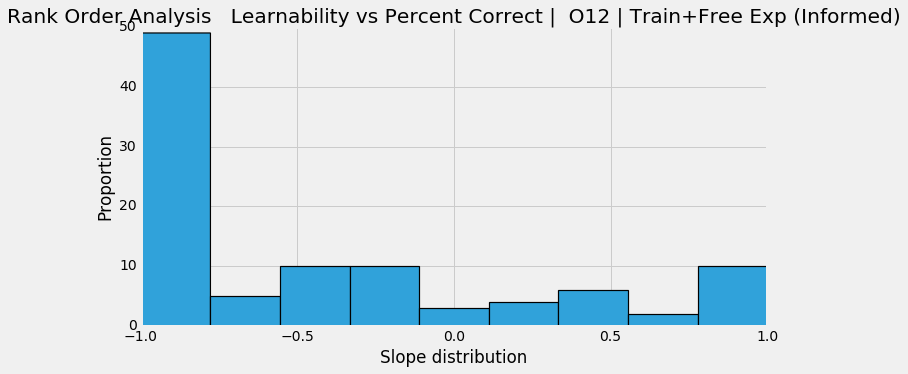

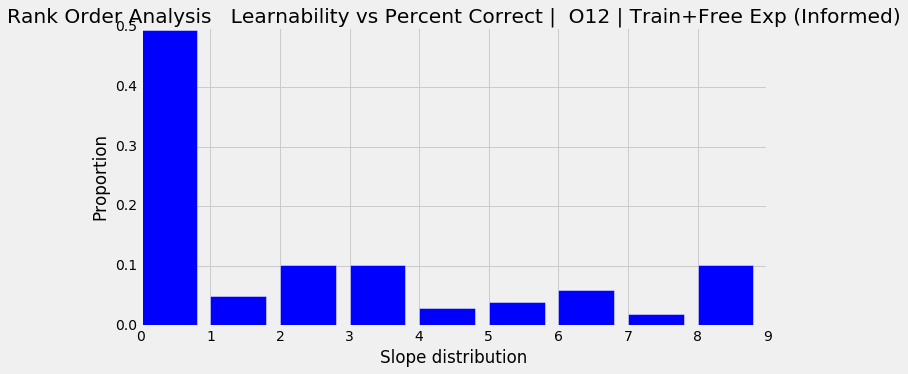

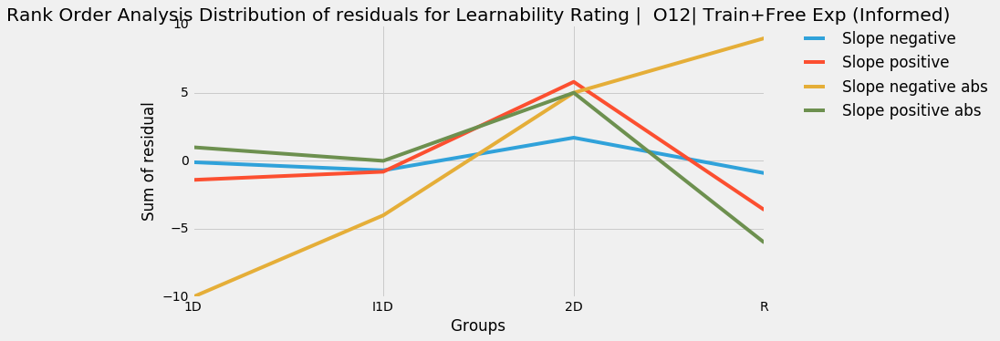

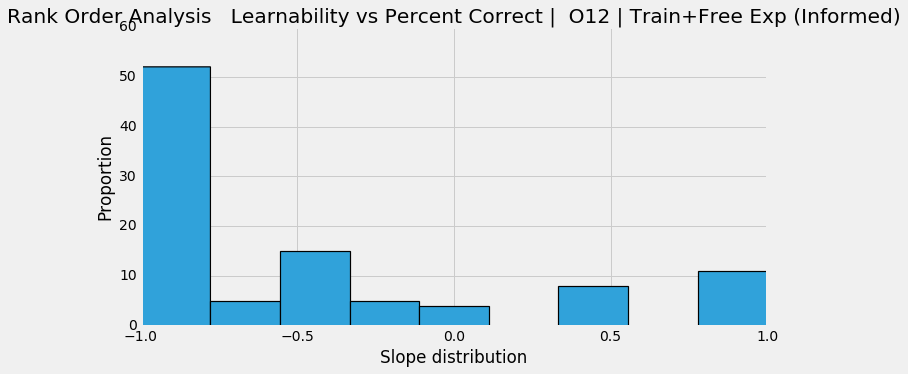

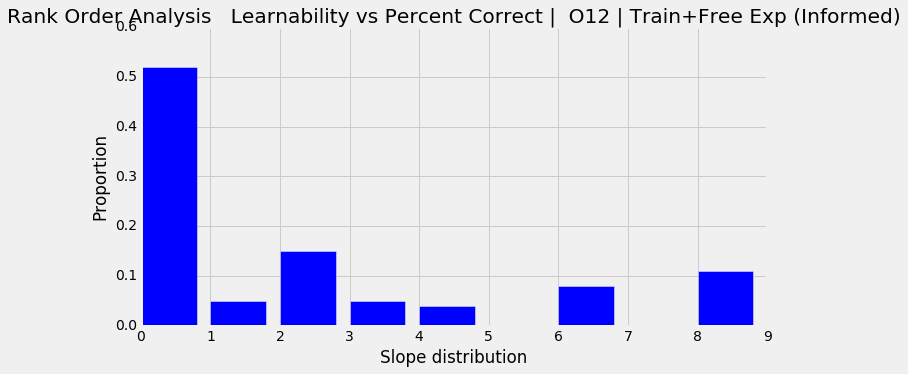

...

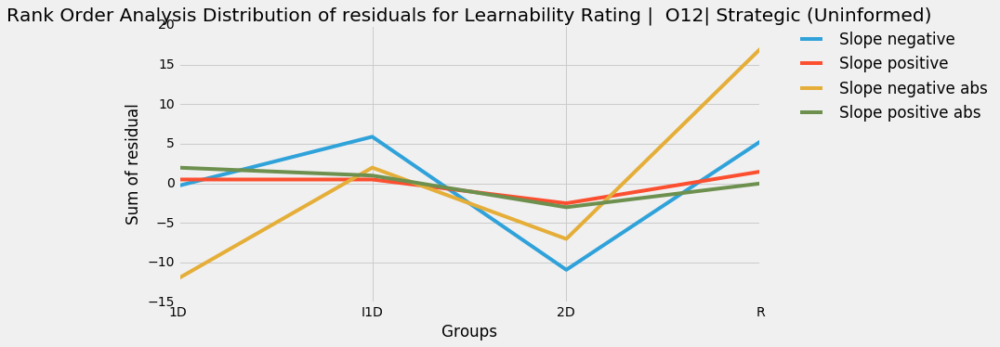

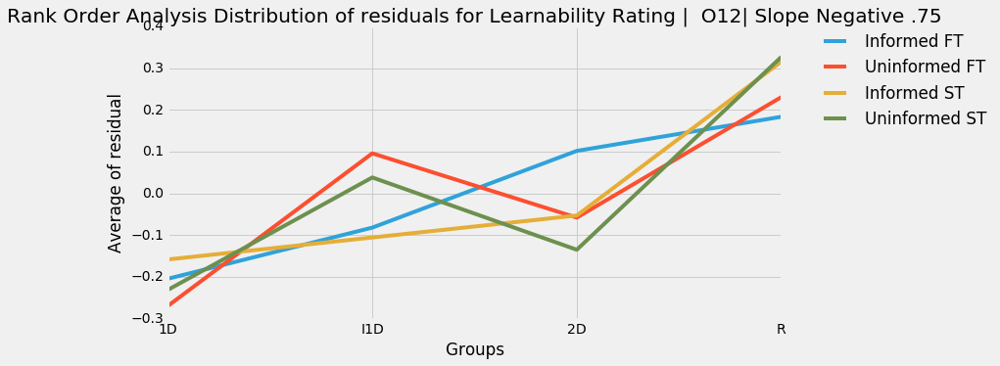

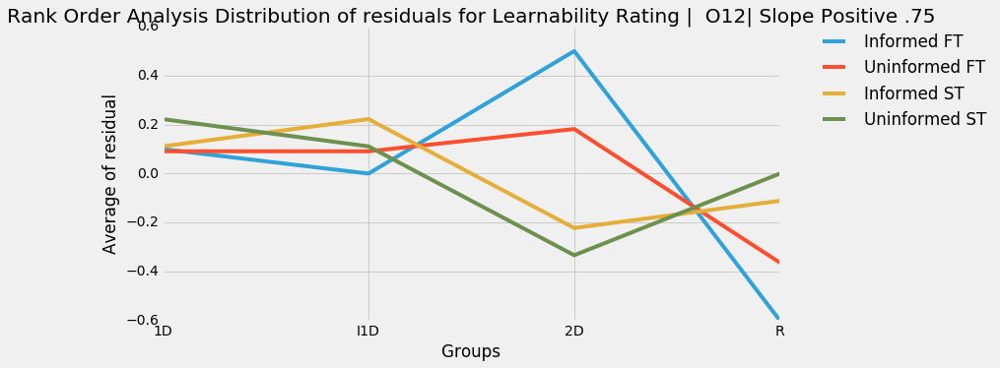

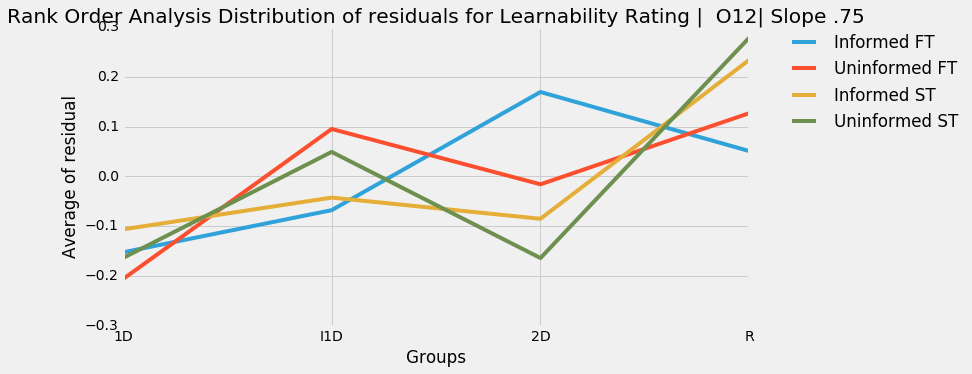

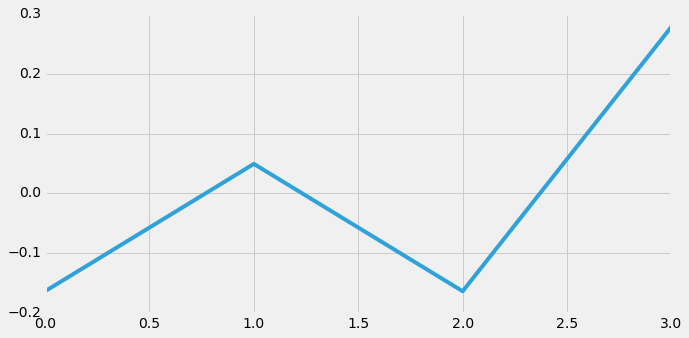

In [21]:
import operator
def histogram_pvalue(arr,bins,title,label,xlabel,ylabel, *args):
    fig, ax = plt.subplots(figsize=(10, 5))
    h,_,patch = plt.hist(arr, bins=bins, histtype='bar', edgecolor='black',linewidth=1.2)
    avg = [float(x / sum(h)) for x in h]
    bins = [0,0.05, 0.1, .2, 0.3, 0.4, 0.5, 0.6, 0.7,0.8,0.9,1]
    plt.figure(figsize=(10, 5))
    b = plt.bar(np.arange(len(avg)), avg)
    plt.xticks( np.arange(len(avg)), ('0','0.05', '0.1', '.2', '0.3', '0.4', '0.5', '0.6', '0.7','0.8','0.9','1') )
    b[0].set_color('r')
    plt.title(''.join(title +' | '+label))
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    if len(args) >0:
        np.savetxt(args[0],arr,delimiter=" ",fmt='%s')
        
def histogram_slope(arr,bins,title,label,xlabel,ylabel, *args):
    fig, ax = plt.subplots(figsize=(10, 5))
    
    h,_,patch = plt.hist(arr, bins=bins, histtype='bar', edgecolor='black',linewidth=1.2)

    avg = [float(x / sum(h)) for x in h]
    
    
    #print avg
    plt.figure(figsize=(10, 5))

    b = plt.bar(np.arange(len(avg)), avg)
    
    plt.title(''.join(title +' | '+label))
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    ax.set_title(''.join(title +' | '+label))
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    if len(args) >0:
        np.savetxt(args[0],arr,delimiter=" ",fmt='%s')

def O12(group,groupid):
    title = "Rank Order Analysis   Learnability vs Percent Correct |  O12"
    xlabel = "Slope distribution"
    ylabel = "Proportion"
    
    rank_PercentCorrect = getRankOrder(group,15)
    rank_Learnability = getRankOrder(group,12)
   
    
    # Apply regression Model
    data_group=[]
    
    for i in range(int(len(group)/4)):
        
        slope, intercept, r_value, p_value, std_err = stats.linregress(rank_PercentCorrect[i], rank_Learnability[i])
        # 0- slope, 1 - pvalue, 2 - intercept, 3 - %Correct, 4 - Learnability, 5 - id
        data_group.append([slope,p_value,intercept,rank_PercentCorrect[i],rank_Learnability[i],i])
    #Histogram Data 
    

    bins = np.linspace(-1,1,10)
    
    histogram_slope([item[0] for item in data_group],bins,title,group_labels[groupid],xlabel,ylabel)
    
    
    
    #Getting significant ones
    
    slope_negative =  [item for item in data_group if item[0] < -0.75]
    slope_positive =  [item for item in data_group if item[0] > 0.75]
    slope_zero =  [item for item in data_group if item[0] >= -0.75  if item[0] <= 0.75]
    slope_zero =  [item for item in data_group if item[1] < 0.05  if item[0] == 0]
    
    return slope_negative,slope_positive,slope_zero,data_group
    

def O12_plot(slope,label):
    plt.figure()
    for i in range (len(slope)):
        plt.plot(slope[i][4],slope[i][3], linewidth=0.75)
    title = "Rank Order Analysis   Learnability vs Percent Correct |  O12"
    xlabel = "Learnability Rank"
    ylabel = "%Percent Rank"
    plt.title(''.join(title +' | '+label))
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

def O12_plot_regression(data_group):
    plt.figure()
    slope_negative =  [item for item in data_group if item[0] < -0.75]
    x =  np.arange(4)
    print len(slope_negative)
    for i in range(len(slope_negative)):
        plt.plot(x, slope_negative[i][2] +  slope_negative[i][0]*x, 'o', label='fitted line',linewidth=0.75)
      
    
    plt.figure()
    slope_positive =  [item for item in data_group if item[0] > 0.75]
    
    for i in range(len(slope_positive)):
        plt.plot(x, slope_positive[i][2] +  slope_positive[i][0]*x, 'o', label='fitted line',linewidth=0.75)
        

def O12_residual(data_group,abs_regression):
    
    # 0- slope, 1 - pvalue, 2 - intercept, 3 - %Correct, 4 - Learnability, 5 - id
    lRating =  [item[4] for item in data_group]
    percentCorrect =  [item[3] for item in data_group]
    slope_list = [item[0] for item in data_group]
    intercept_list = [item[2] for item in data_group]
    category = []
    regressionPoint = []
    abs_regression_list = []
    for i in range(len(data_group)) :
        
        # Create category list
        category.append( np.array(range(0,4)) )
        # Create regression point list for 4 points
        regressionPoint.append(np.array([x * slope_list[i] + intercept_list[i] for x in [1,2,3,4]]))
        
        # Create absolute regression list of 4 points
        abs_regression_list.append(abs_regression)
        
        #Sort lRating and rearrange percentCorrect and category
    
        ind = percentCorrect[i].argsort()
        
        lRating[i] = lRating[i][ind]
        
        category[i] = category[i][ind]
        
        percentCorrect[i] = np.sort(percentCorrect[i])
    residual = list(map(operator.sub, lRating, regressionPoint))
    residual_2 = list(map(operator.sub, lRating, abs_regression_list))
    arr = zip(lRating,percentCorrect,category,regressionPoint,residual,residual_2)
    return [sum(i) for i in zip(*residual)],[sum(i) for i in zip(*residual_2)],residual_2, [float(sum(i))/len(i) for i in zip(*residual_2)]
    
def O12_plot_residual():
    title = "Rank Order Analysis Distribution of residuals for Learnability Rating |  O12"
    xlabel = "Groups"
    ylabel = "Sum of residual"
    
    
    
    #Call O12 function to retrieve groups (1)
    slope_negative,slope_positive,slope_zero,data_group = O12(informedFT,0)

    bins = np.arange(4)
    
    fig,ax = plt.subplots(figsize = (10,5))
    
    ax.set_title(title + "| "+ group_labels[0])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    abs_regression_negative =  [4,3,2,1]
    abs_regression_positive =  [1,2,3,4]
    
    #Calculating residuals for slope negative
    ax.plot(bins,O12_residual(slope_negative,abs_regression_negative)[0],label = "Slope negative")
    ax.plot(bins,O12_residual(slope_positive,abs_regression_positive)[0],label = "Slope positive")
    ax.plot(bins,O12_residual(slope_negative,abs_regression_negative)[1],label = "Slope negative abs")
    ax.plot(bins,O12_residual(slope_positive,abs_regression_positive)[1],label = "Slope positive abs")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Calculating averages of residuals with "ideal" slope line
    slopeNegativeG1 = O12_residual(slope_negative,abs_regression_negative)[3]
    slopePositiveG1 = O12_residual(slope_positive,abs_regression_positive)[3]
    lenNegativeG1 = len(slope_negative)
    lenPositiveG1 = len(slope_positive)
    
    
    
    #Call O12 function to retrieve groups (2)
    slope_negative,slope_positive,slope_zero,data_group = O12(uninformedFT,0)

    bins = np.arange(5)
    
    #print O12_residual(slope_negative)
    fig,ax = plt.subplots(figsize = (10,5))
    
    ax.set_title(title + "| "+ group_labels[1])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    abs_regression_negative =  [4,3,2,1]
    abs_regression_positive =  [1,2,3,4]
    
    #Calculating residuals for slope negative
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[0],label = "Slope negative")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[0],label = "Slope positive")
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[1],label = "Slope negative abs")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[1],label = "Slope positive abs")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Calculating averages of residuals with "ideal" slope line
    slopeNegativeG2 = O12_residual(slope_negative,abs_regression_negative)[3]
    slopePositiveG2 = O12_residual(slope_positive,abs_regression_positive)[3]
    lenNegativeG2 = len(slope_negative)
    lenPositiveG2 = len(slope_positive)
    
    #Call O12 function to retrieve groups (3)
    slope_negative,slope_positive,slope_zero,data_group = O12(informedST,0)

    bins = np.arange(5)
    
    #print O12_residual(slope_negative)
    fig,ax = plt.subplots(figsize = (10,5))
    
    ax.set_title(title + "| "+ group_labels[2])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    abs_regression_negative =  [4,3,2,1]
    abs_regression_positive =  [1,2,3,4]
    
    #Calculating residuals for slope negative
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[0],label = "Slope negative")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[0],label = "Slope positive")
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[1],label = "Slope negative abs")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[1],label = "Slope positive abs")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Calculating averages of residuals with "ideal" slope line
    slopeNegativeG3 = O12_residual(slope_negative,abs_regression_negative)[3]
    slopePositiveG3 = O12_residual(slope_positive,abs_regression_positive)[3]
    lenNegativeG3 = len(slope_negative)
    lenPositiveG3 = len(slope_positive)
    
    #Call O12 function to retrieve groups (4)
    slope_negative,slope_positive,slope_zero,data_group = O12(uninformedST,0)

    bins = np.arange(6)
    
    #print O12_residual(slope_negative)
    fig,ax = plt.subplots(figsize = (10,5))
    
    ax.set_title(title + "| "+ group_labels[3])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    abs_regression_negative =  [4,3,2,1]
    abs_regression_positive =  [1,2,3,4]
    
    #Calculating residuals for slope negative
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[0],label = "Slope negative")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[0],label = "Slope positive")
    ax.plot(np.arange(4),O12_residual(slope_negative,abs_regression_negative)[1],label = "Slope negative abs")
    ax.plot(np.arange(4),O12_residual(slope_positive,abs_regression_positive)[1],label = "Slope positive abs")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Calculating averages of residuals with "ideal" slope line
    slopeNegativeG4 = O12_residual(slope_negative,abs_regression_negative)[3]
    slopePositiveG4 = O12_residual(slope_positive,abs_regression_positive)[3]
    lenNegativeG4 = len(slope_negative)
    lenPositiveG4 = len(slope_positive)
    
    
    
    #Plotting yellow lines from all the four groups 
    #Slope Negative
    ylabel = "Average of residual"
    fig,ax = plt.subplots(figsize = (10,5))
    ax.set_title(title + "| "+"Slope Negative .75")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    
    ax.plot(np.arange(4),slopeNegativeG1,label = "Informed FT")
    ax.plot(np.arange(4),slopeNegativeG2,label = "Uninformed FT")
    ax.plot(np.arange(4),slopeNegativeG3,label = "Informed ST")
    ax.plot(np.arange(4),slopeNegativeG4,label = "Uninformed ST")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Slope Positive
    fig,ax = plt.subplots(figsize = (10,5))
    ax.set_title(title + "| "+"Slope Positive .75")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    
    ax.plot(np.arange(4),slopePositiveG1,label = "Informed FT")
    ax.plot(np.arange(4),slopePositiveG2,label = "Uninformed FT")
    ax.plot(np.arange(4),slopePositiveG3,label = "Informed ST")
    ax.plot(np.arange(4),slopePositiveG4,label = "Uninformed ST")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    #Slope All Average
    from operator import add
    #Calculate weighted average of Slope Negative and Positive
    slopeAllG1 = map(add, [x * float(lenNegativeG1)/(lenNegativeG1 + lenPositiveG1) for x in slopeNegativeG1], [x * float(lenPositiveG1)/(lenNegativeG1 + lenPositiveG1) for x in slopePositiveG1])
    slopeAllG2 = map(add, [x * float(lenNegativeG2)/(lenNegativeG2 + lenPositiveG2) for x in slopeNegativeG2], [x * float(lenPositiveG2)/(lenNegativeG2 + lenPositiveG2) for x in slopePositiveG2])
    slopeAllG3 = map(add, [x * float(lenNegativeG3)/(lenNegativeG3 + lenPositiveG3) for x in slopeNegativeG3], [x * float(lenPositiveG3)/(lenNegativeG3 + lenPositiveG3) for x in slopePositiveG3])
    slopeAllG4 = map(add, [x * float(lenNegativeG4)/(lenNegativeG4 + lenPositiveG4) for x in slopeNegativeG4], [x * float(lenPositiveG4)/(lenNegativeG4 + lenPositiveG4) for x in slopePositiveG4])
    
    
    fig,ax = plt.subplots(figsize = (10,5))
    ax.set_title(title + "| "+"Slope .75")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1D','I1D','2D','R'])
    
    ax.plot(np.arange(4),slopeAllG1,label = "Informed FT")
    ax.plot(np.arange(4),slopeAllG2,label = "Uninformed FT")
    ax.plot(np.arange(4),slopeAllG3,label = "Informed ST")
    ax.plot(np.arange(4),slopeAllG4,label = "Uninformed ST")
    
    
    #print "hh",slopeAllG1
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig,ax = plt.subplots(figsize = (10,5))
    ax.errorbar(np.arange(4),slopeAllG4,label = "Uninformed ST")
    
    



O12_plot_residual()

'''
Uncomment to execute
slope_negative,slope_positive,slope_zero = O12(uninformedFT,1)
print len(slope_negative) , len(slope_positive) 
O12_plot(slope_negative,"uninformed FT")
O12_plot(slope_positive,"uninformed FT")
O12_plot(slope_zero,"uninformed FT")
slope_negative,slope_positive,slope_zero = O12(informedST,2)
print len(slope_negative) , len(slope_positive) 
O12_plot(slope_negative,"informed ST")
O12_plot(slope_positive,"informed ST")
O12_plot(slope_zero,"informed ST")
slope_negative,slope_positive,slope_zero = O12(uninformedST,3)
print len(slope_negative) , len(slope_positive)
O12_plot(slope_negative,"uninformed ST")
O12_plot(slope_positive,"uninformed ST")
O12_plot(slope_zero,"uninformed ST")
#O12(informedFT)
#O12(informedST)
#O12(uninformedST)
'''

### Motive - To find true relation between LRN and PC

### O13

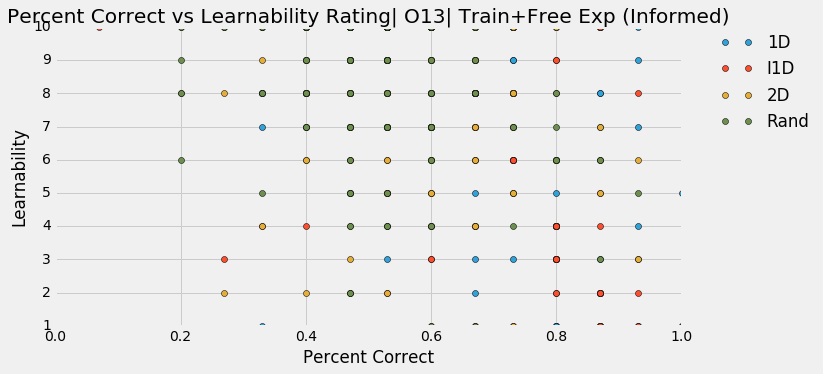

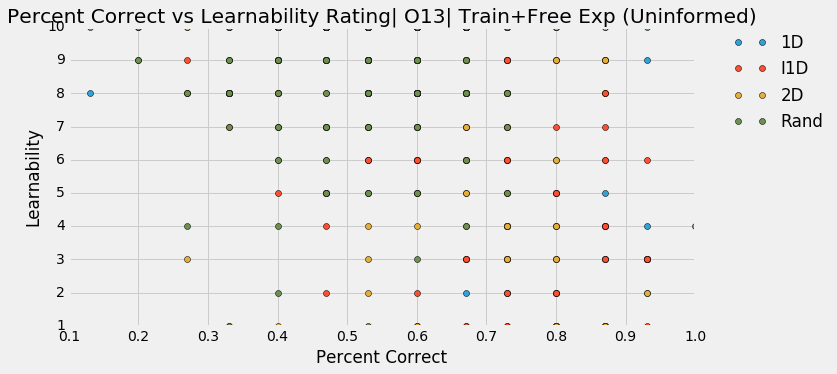

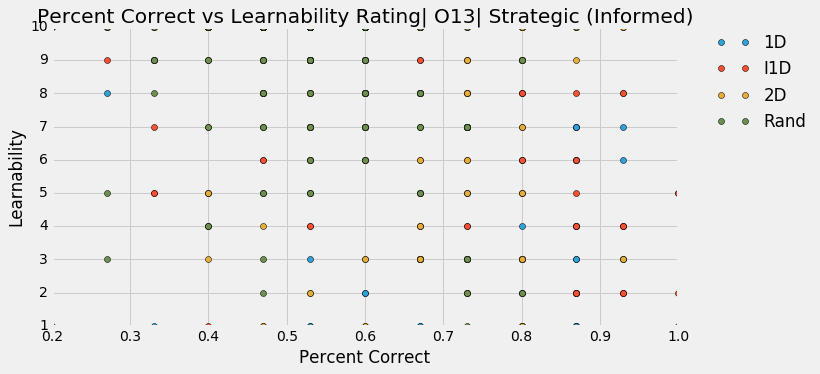

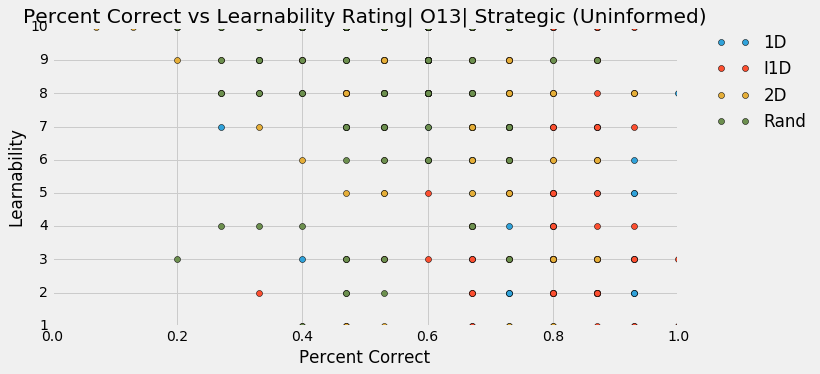

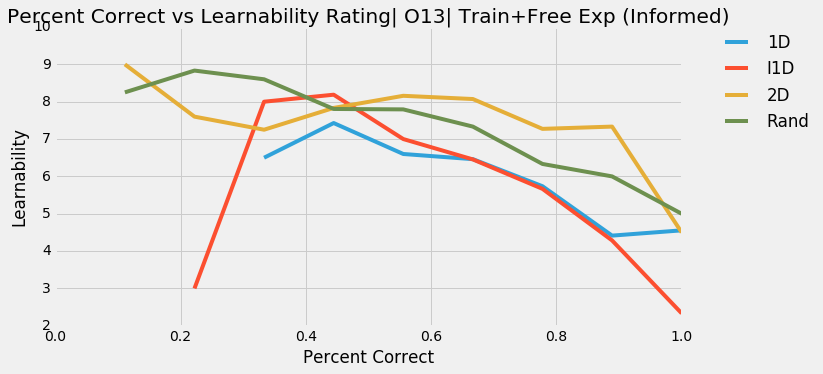

...

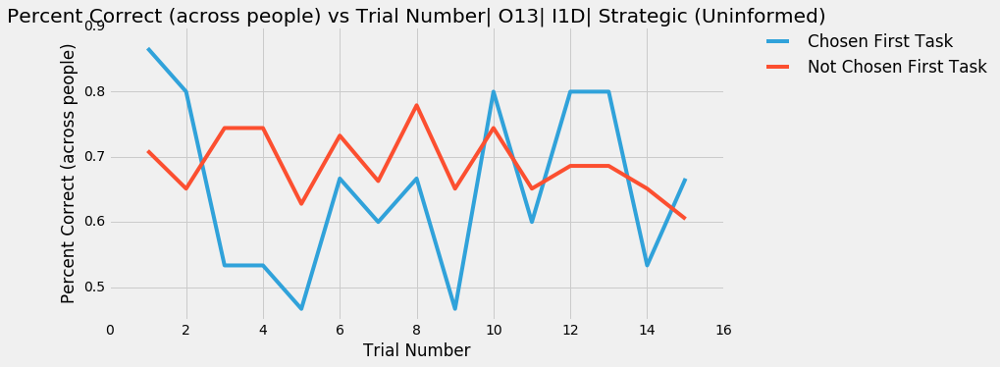

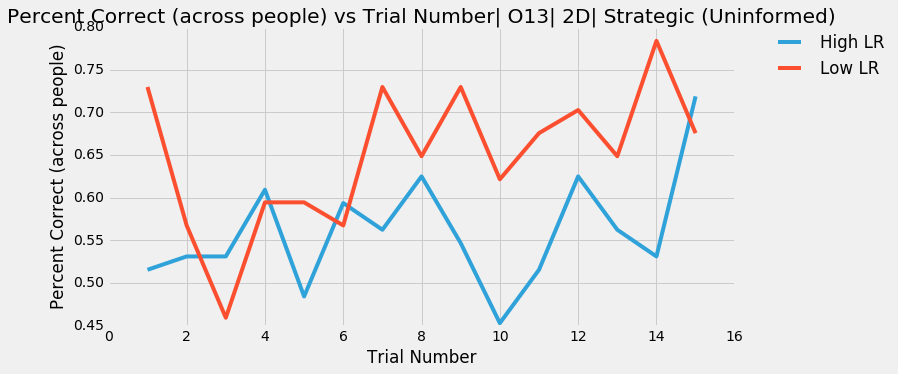

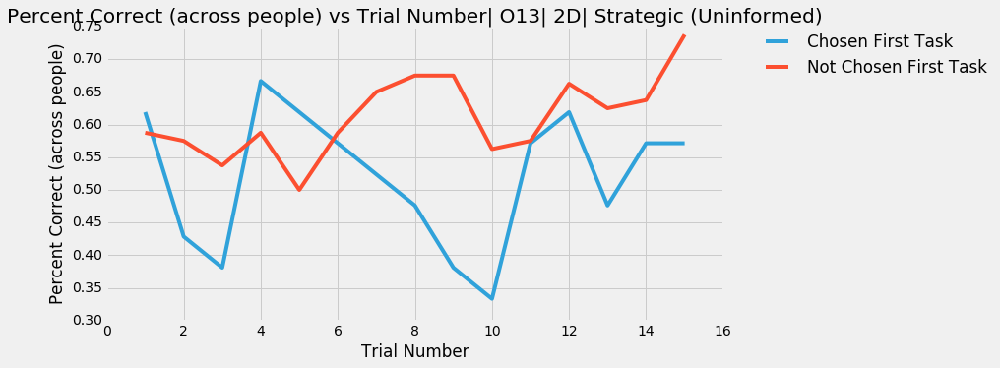

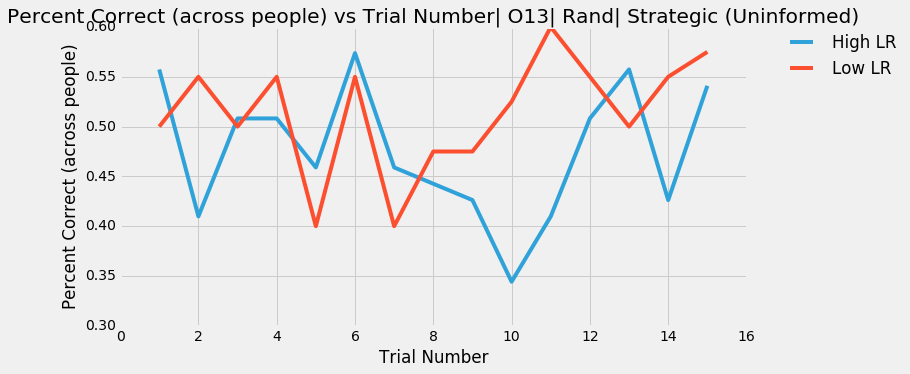

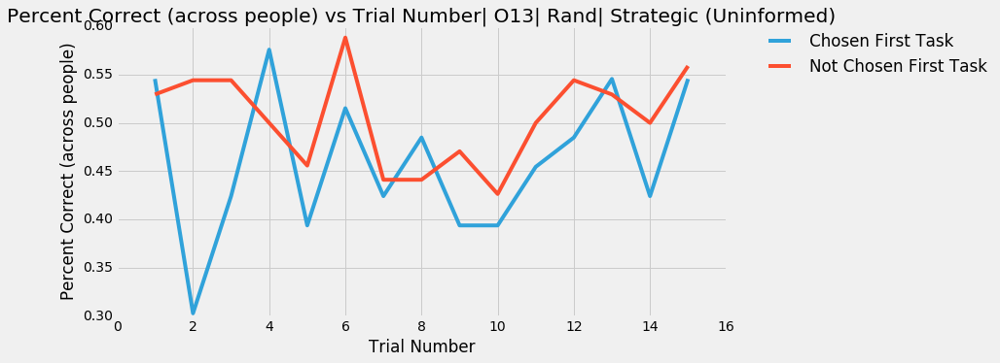

In [23]:
#learnability = 12
#%correct = 15
def O13():
    lr = 12
    pc = 15
    data_LR = [informedFT[:,lr],uninformedFT[:,lr],informedST[:,lr],uninformedST[:,lr]]
    data_PC = [informedFT[:,pc],uninformedFT[:,pc],informedST[:,pc],uninformedST[:,pc]]
    
    title = "Percent Correct vs Learnability Rating| O13"
    xlabel = "Percent Correct"
    ylabel = "Learnability"
    
    # Graphing raw ratings
    for i in range (len(data_LR)):
        fig, ax = plt.subplots(figsize=(10, 5))
            
        for j in range(4):
            # gets the learnability rating for the category numbered j
            data_LRCat = data_LR[i][j::4]
            data_PCCat = data_PC[i][j::4]
            O13_plot(data_PCCat,data_LRCat,group_labels[i],ax,task_categories[j],"o",title,xlabel,ylabel,task_categories[j])
    
    #Graphing bins of %Correct
    bins = np.linspace(0,1,0.1)
    # Iterate over groups 
    for i in range (len(data_LR)):
        fig, ax = plt.subplots(figsize=(10, 5))
        data = np.concatenate((data_LR[i].reshape(len(data_LR[i]),1),data_PC[i].reshape(len(data_PC[i]),1)),axis = 1).T
        bins = np.linspace(0,1,11) 
        
        # Iterate over categories
        for j in range(4):
            # Get data category wise
            avgLR = []
            # Iterate over bins
            for k in range (len(bins) - 1):
                # Find average of learnability rating depending on bin of % Correct
                avgLR.append(np.mean(data[0][j::4][np.where(np.logical_and(data[1][j::4]>=bins[k], data[1][j::4]<=bins[k+1]))[0]]))
            O13_plot(np.linspace(0,1,10),avgLR,group_labels[i],ax,task_categories[j],"-",title,xlabel,ylabel,task_categories[j])
    
    
    title = "Percent Correct (across people) vs Trial Number| O13"
    xlabel = "Trial Number"
    ylabel = "Percent Correct (across people)"
    # Does the rate of learning influence LRN ratings and task selection?
    '''
    1) 16 panels for each (group,task). X axis is trial number of training and y axis is averaged PC. This is divided into 
    two groups. One with LR > median and the other less
    
    2) Second group. Division of group is on whether they selected that task in the first trial of exploration or not. 
    '''
    dataStack = [informedFT,uninformedFT,informedST,uninformedST]
    dataTrainingUser = [splitCsvFTTI,splitCsvFTTU,splitCsvSTTI,splitCsvSTTU]
    dataExploreUser = [splitCsvFTEI,splitCsvFTEU,splitCsvSTEI,splitCsvSTEU]
    
    # Iterate through groups
    for i in range(len(dataTrainingUser)):
        
        # Iterate through tasks of each group
        for j in range(tasks):
             
            fig, ax = plt.subplots(figsize=(10, 5))
            fig, ax2 = plt.subplots(figsize=(10, 5))
            
            trialResults = []
            usersLR = [] 
            usersFC = []
            
            # Iterate over range of users
            for k in range(len(dataTrainingUser[i])):
                
                # Get the 15 task trial results of j category of kth user in ith group 
                trialResults.append(dataTrainingUser[i][k][dataTrainingUser[i][k][:,1].argsort()][j*15:j*15+15][:,2])
            
                # Get Learnability Rating for user (user*4 + j,12)
                usersLR.append(dataStack[i][k*tasks + j,lr])
            
            
            # Get First Choice Seleced by users 
            usersFC.append(checkFirstOption(dataExploreUser[i],len(dataExploreUser[i])))
    
            #Find median of learnability to split users into two groups 
            median = np.median(usersLR)

            #Find indices of LR >= median & LR < median
            hLR = np.nonzero(usersLR >= median)
            lLR = np.nonzero(usersLR < median)
            #print np.shape(hLR),np.shape(lLR)
            #print hLR,lLR
            
            # Get Trial Results from identified index
            trialResultshLR = np.array(trialResults)[hLR]
            trialResultslLR = np.array(trialResults)[lLR]
            #print np.shape(trialResultshLR),np.shape(trialResultslLR)
            
            #Find people who have selected task at hand and split into groups
            #Find indices of task == first selected
            hFC = np.nonzero(usersFC[0] == j)
            lFC = np.nonzero(usersFC[0] != j)
            #print "lfc",lFC
            

            # Get Trial Results from identified index
            trialResultshFC = np.array(trialResults)[hFC]
            trialResultslFC = np.array(trialResults)[lFC]
    
            
            
            #Calculate percentCorrect with every trial number for LR group
            TrialPChLR = []
            TrialPClLR = []
            for l in range (15): 
                TrialPChLR.append(float(sum(row[l] for row in trialResultshLR))/len(trialResultshLR))
                TrialPClLR.append(float(sum(row[l] for row in trialResultslLR))/len(trialResultslLR))
            
            
            O13_plot(np.arange(1,16),TrialPChLR,group_labels[i],ax,task_categories[j],"-",title + "| "+ task_categories[j],xlabel,ylabel,"High LR")
            O13_plot(np.arange(1,16),TrialPClLR,group_labels[i],ax,task_categories[j],"-",title + "| "+ task_categories[j],xlabel,ylabel,"Low LR")
            
            
            #Calculate percentCorrect with every trial number for FC group
            TrialPChFC = []
            TrialPClFC = []
            #print len(trialResults)
            for l in range (15): 
                TrialPChFC.append(float(sum(row[l] for row in trialResultshFC))/len(trialResultshFC))
                TrialPClFC.append(float(sum(row[l] for row in trialResultslFC))/len(trialResultslFC))
            
            
            O13_plot(np.arange(1,16),TrialPChFC,group_labels[i],ax2,task_categories[j],"-",title + "| "+ task_categories[j],xlabel,ylabel,"Chosen First Task")
            O13_plot(np.arange(1,16),TrialPClFC,group_labels[i],ax2,task_categories[j],"-",title + "| "+ task_categories[j],xlabel,ylabel,"Not Chosen First Task")
        
def O13_plot(x,y,group,ax,category,dot,title,xlabel,ylabel,label):
   
    
    
    ax.set_title(title + "| "+group)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    ax.plot(x,y,dot,label=label)
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

O13()



